In [1]:
import numpy as np
import torch
from pytorch_wavelets import DTCWTForward, DTCWTInverse
xfm = DTCWTForward(J=3)
ifm = DTCWTInverse()
x = torch.zeros(1,1,64,64)
# Create 12 outputs, one for the real and imaginary point spread functions
# for each of the 6 orientations
out = np.zeros((12,64,64))
yl, yh = xfm(x)
# for b in range(6):
#     for ri in range(2):
#         yh[2][0,0,b,4,4,ri] = 1
#         out[b*2 + ri] = ifm((yl, yh))
#         yh[2][0,0,b,4,4,ri] = 0
# # Can now plot the output
# fig = plt.figure()
# ax = fig.add_subplot(111)
# ax.imshow(x[0,0,:,:])
# plt.show()

# for i in range(12):
#     fig = plt.figure()
#     ax = fig.add_subplot(111)
#     ax.imshow(out[i,:,:])
#     plt.show()

In [2]:
import os
import cv2
import ipdb
import torch
import numpy as np 
import argparse
from matplotlib import interactive
interactive(True)
from skimage.measure import compare_ssim as ssim
import matplotlib.pyplot as plt

from pytorch_wavelets import DTCWTForward, DTCWTInverse
plt.rcParams["figure.figsize"] = [16,9]


In [2]:
plt.rcParams["figure.figsize"] = [16*3,9*3]


In [3]:

def psnr(img1, img2):
    size = img1.shape

    PIXEL_MAX = 255.0

    if len(size) == 2:
        mse = np.mean( (img1 - img2) ** 2 )
        if mse == 0:
            psnr = 100
        else:
            psnr = 20 * np.log10(PIXEL_MAX / np.sqrt(mse))
    else: # len(size) == 3
        h,w,c = size
        psnr = 0
        for i in range(c):
            mse = np.mean((img1[:,:,i] - img2[:,:,i]) ** 2)
            if mse == 0:
                psnr += 100
            else:
                psnr += 20 * np.log10(PIXEL_MAX / np.sqrt(mse))
        psnr /= c

    return psnr

def touch(path):
    with open(path, 'a'):
        os.utime(path, None)

D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37
700
.\dwt_stats.txt
3
[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40001.png]	[PSNR:40.37858735607854]	[SSIM:0.9602251167900638][yl: 0] 	 [yh: 532313.9375] 	 [yt: 3737709.8125] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40002.png]	[PSNR:39.40780090468016]	[SSIM:0.9537469519634901][yl: 1] 	 [yh: 635173.6875] 	 [yt: 4001704.8125] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40003.png]	[PSNR:39.179338515329974]	[SSIM:0.9515689043787834][yl: 2] 	 [yh: 663324.5] 	 [yt: 4090590.375] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40004.png]	[PSNR:39.198725097232575]	[SSIM:0.951579331201294][yl: 3] 	 [yh: 666862.75] 	 [yt: 4049103.125] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40005.png]	[PSNR:39.666

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40041.png]	[PSNR:39.32802438096095]	[SSIM:0.9505221553575899][yl: 40] 	 [yh: 706141.8125] 	 [yt: 3970537.5] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40042.png]	[PSNR:38.99991110450344]	[SSIM:0.9486999923268493][yl: 41] 	 [yh: 755193.75] 	 [yt: 3943231.5] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40043.png]	[PSNR:39.08019963629785]	[SSIM:0.9495404059730689][yl: 42] 	 [yh: 745666.0] 	 [yt: 3949117.0625] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40044.png]	[PSNR:38.9270726380018]	[SSIM:0.9490943890574718][yl: 43] 	 [yh: 766133.9375] 	 [yt: 3949500.875] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40045.png]	[PSNR:39.47551200083843]	[SSIM:0.9528460506362701][yl: 44] 	 [yh: 703219.25] 	 [yt: 390922

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40082.png]	[PSNR:39.139041130274315]	[SSIM:0.9532041659366933][yl: 81] 	 [yh: 768255.375] 	 [yt: 3973352.125] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40083.png]	[PSNR:39.18516700805678]	[SSIM:0.9535143771202153][yl: 82] 	 [yh: 759790.4375] 	 [yt: 3957484.125] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40084.png]	[PSNR:39.09193061823344]	[SSIM:0.9526415740966053][yl: 83] 	 [yh: 774005.5] 	 [yt: 3945319.25] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40085.png]	[PSNR:39.620134705722045]	[SSIM:0.9550695940620577][yl: 84] 	 [yh: 703537.375] 	 [yt: 3937116.1875] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40086.png]	[PSNR:39.05302790315712]	[SSIM:0.9520411887074982][yl: 85] 	 [yh: 777189.5625] 	 [yt

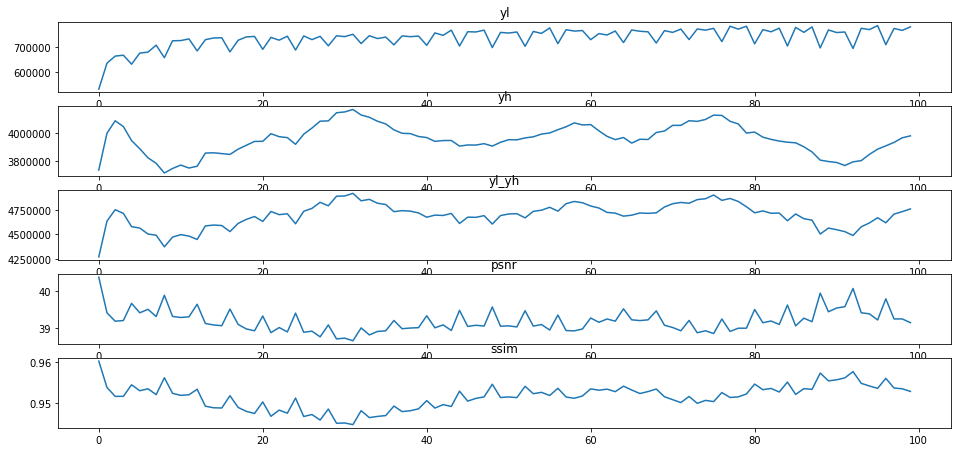

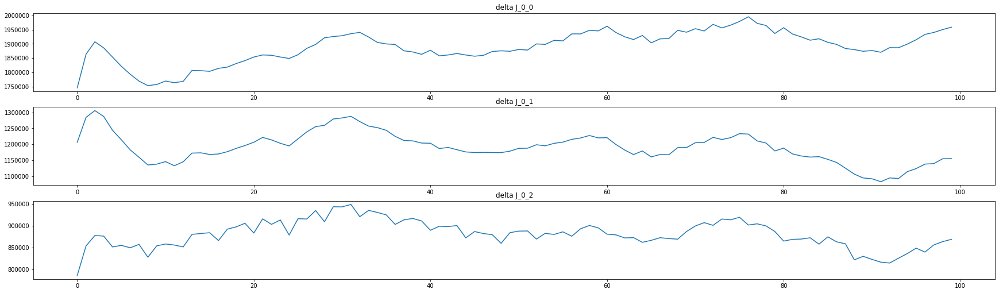

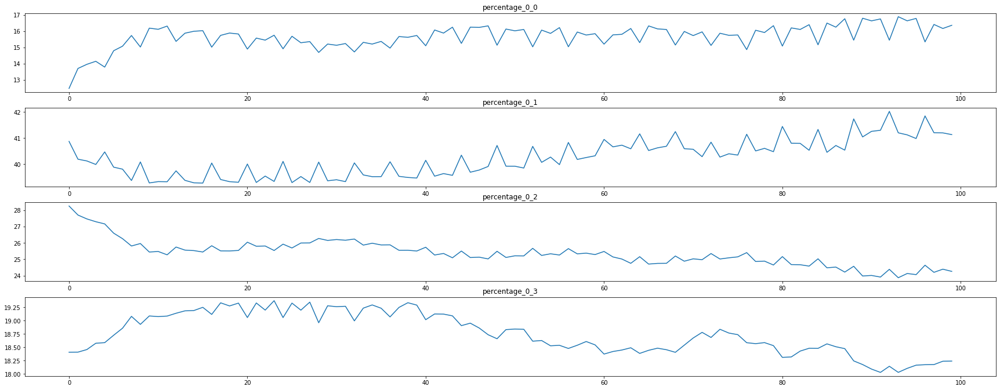

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40001.png]	[PSNR:37.67834126869575]	[SSIM:0.9343499251803252][yl: 100] 	 [yh: 619123.6875] 	 [yt: 5791071.0] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40002.png]	[PSNR:37.82980713043854]	[SSIM:0.9370822971256322][yl: 101] 	 [yh: 642195.1875] 	 [yt: 5561125.25] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40003.png]	[PSNR:37.350819649502355]	[SSIM:0.9314894058714207][yl: 102] 	 [yh: 688362.0] 	 [yt: 5857115.0] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40004.png]	[PSNR:36.80464028682096]	[SSIM:0.9237473817607335][yl: 103] 	 [yh: 739644.3125] 	 [yt: 6249311.75] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40005.png]	[PSNR:37.12390354652631]	[SSIM:0.9294740952952014][yl: 104] 	 [yh: 735

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40041.png]	[PSNR:36.2315804701481]	[SSIM:0.9140218863055358][yl: 140] 	 [yh: 859884.375] 	 [yt: 6267816.875] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40042.png]	[PSNR:36.36511408912408]	[SSIM:0.916298750510551][yl: 141] 	 [yh: 840802.6875] 	 [yt: 6246440.875] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40043.png]	[PSNR:36.00369305372388]	[SSIM:0.9097395951179171][yl: 142] 	 [yh: 880527.8125] 	 [yt: 6625409.625] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40044.png]	[PSNR:36.464901771047295]	[SSIM:0.9176883852254202][yl: 143] 	 [yh: 825237.1875] 	 [yt: 6112460.875] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40045.png]	[PSNR:36.04298254042327]	[SSIM:0.9110859292155999][yl: 144] 	 [y

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40081.png]	[PSNR:35.852983888088005]	[SSIM:0.9081030999639159][yl: 180] 	 [yh: 922114.125] 	 [yt: 6586857.625] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40082.png]	[PSNR:35.86852846446395]	[SSIM:0.907501387234824][yl: 181] 	 [yh: 895722.5] 	 [yt: 6760457.75] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40083.png]	[PSNR:36.23054241583907]	[SSIM:0.9142946926593566][yl: 182] 	 [yh: 859559.875] 	 [yt: 6319793.875] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40084.png]	[PSNR:36.10575002517882]	[SSIM:0.9127616926510483][yl: 183] 	 [yh: 884068.3125] 	 [yt: 6398411.625] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40085.png]	[PSNR:35.65225189674458]	[SSIM:0.9037995204739164][yl: 184] 	 [yh: 9

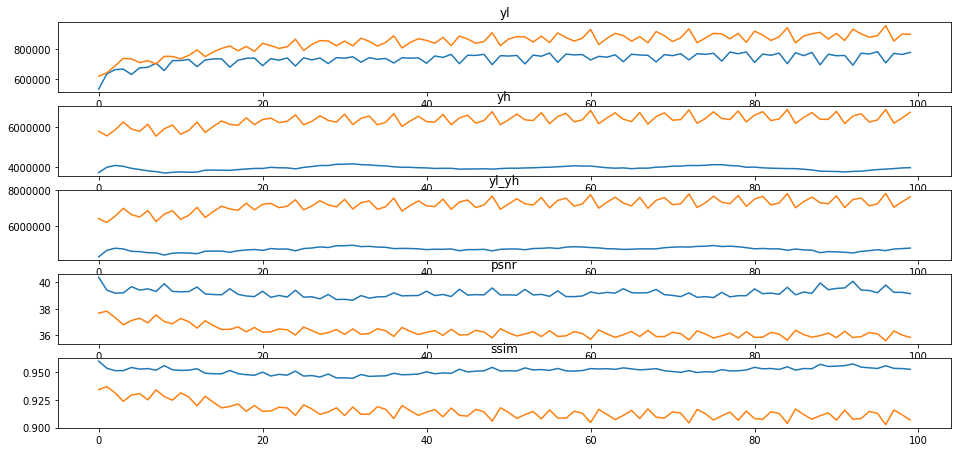

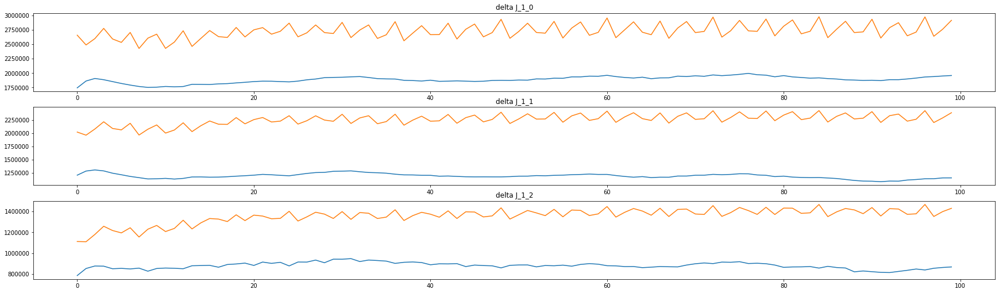

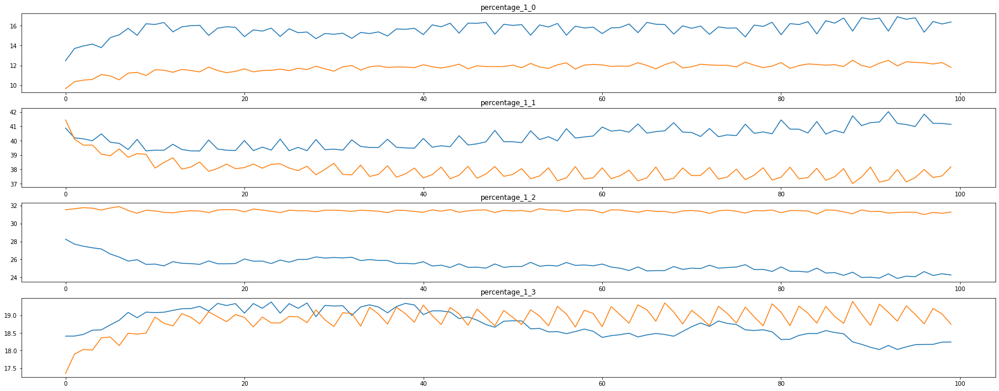

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40001.png]	[PSNR:38.413721759177236]	[SSIM:0.9531412187380952][yl: 200] 	 [yh: 666103.9375] 	 [yt: 5460295.0] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40002.png]	[PSNR:38.385212968850276]	[SSIM:0.9530701187681008][yl: 201] 	 [yh: 680903.625] 	 [yt: 5453924.625] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40003.png]	[PSNR:38.35071063375424]	[SSIM:0.952951745314837][yl: 202] 	 [yh: 687398.9375] 	 [yt: 5465565.625] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40004.png]	[PSNR:38.37065415783015]	[SSIM:0.953008763303112][yl: 203] 	 [yh: 684698.5625] 	 [yt: 5451482.375] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40005.png]	[PSNR:38.212824422164395]	[SSIM:0.9516680786873137][yl: 204] 	 [yh: 70

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40041.png]	[PSNR:37.57730680925104]	[SSIM:0.946554177949109][yl: 240] 	 [yh: 825693.25] 	 [yt: 5829871.375] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40042.png]	[PSNR:37.8032163981235]	[SSIM:0.9484653758383673][yl: 241] 	 [yh: 793936.5625] 	 [yt: 5656048.0] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40043.png]	[PSNR:37.77747709389494]	[SSIM:0.9480089768256377][yl: 242] 	 [yh: 794797.6875] 	 [yt: 5693806.5] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40044.png]	[PSNR:37.833746740590605]	[SSIM:0.9485383307480532][yl: 243] 	 [yh: 786366.25] 	 [yt: 5661949.875] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40045.png]	[PSNR:37.510945377501706]	[SSIM:0.946437262431977][yl: 244] 	 [yh: 844821.68

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40081.png]	[PSNR:37.34583317540257]	[SSIM:0.9435341358185058][yl: 280] 	 [yh: 850662.875] 	 [yt: 6083723.75] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40082.png]	[PSNR:37.57752714682803]	[SSIM:0.9456677758436813][yl: 281] 	 [yh: 814451.3125] 	 [yt: 5912626.875] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40083.png]	[PSNR:37.5064805672639]	[SSIM:0.9447842080690514][yl: 282] 	 [yh: 824133.5625] 	 [yt: 5985125.125] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40084.png]	[PSNR:37.5219741513658]	[SSIM:0.9451302408507342][yl: 283] 	 [yh: 826420.875] 	 [yt: 5940513.75] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40085.png]	[PSNR:37.28178271945359]	[SSIM:0.9430375892346082][yl: 284] 	 [yh: 865846

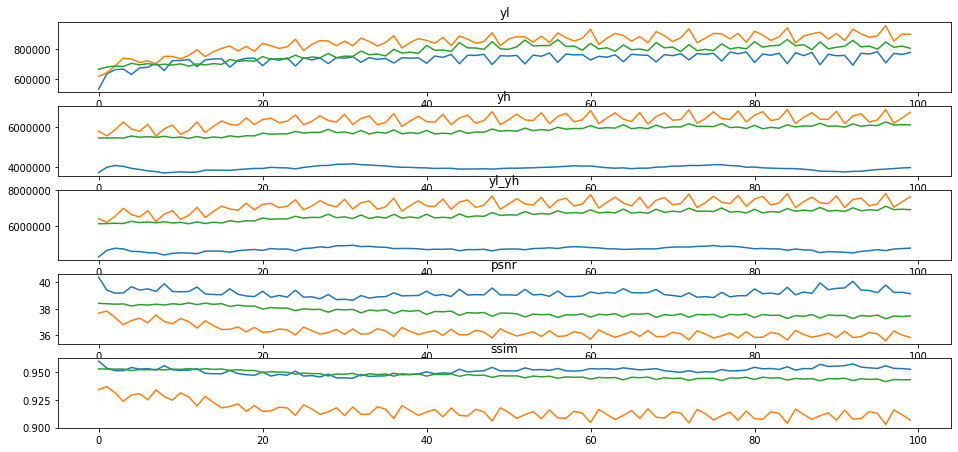

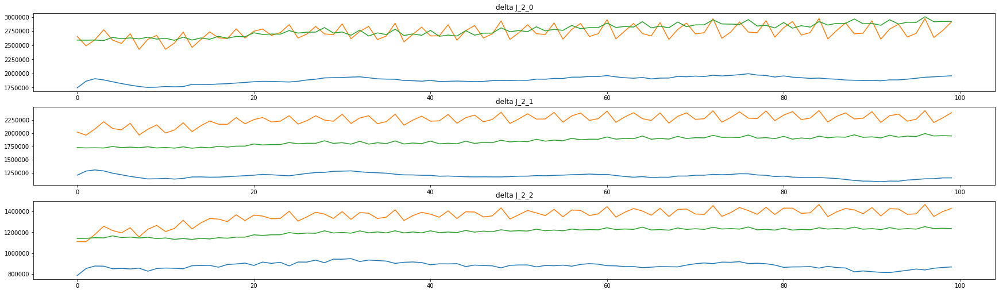

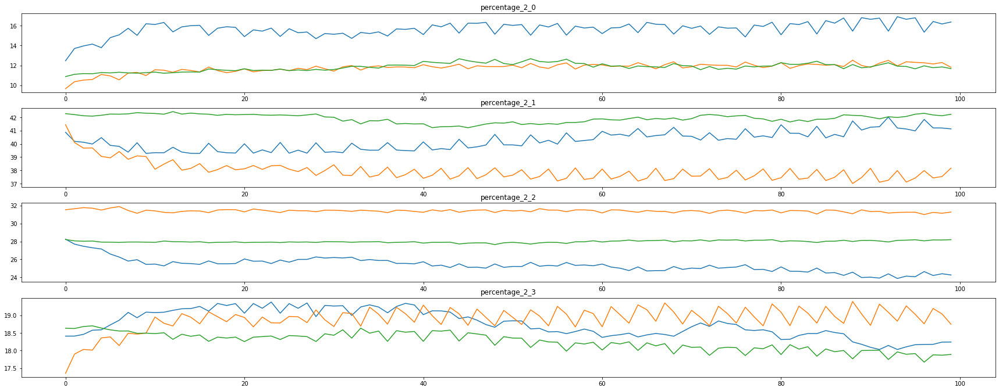

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40001.png]	[PSNR:38.9440493289547]	[SSIM:0.9510231985704545][yl: 300] 	 [yh: 651629.25] 	 [yt: 4690395.8125] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40002.png]	[PSNR:38.38403191092229]	[SSIM:0.9473131717195423][yl: 301] 	 [yh: 735008.375] 	 [yt: 4931902.25] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40003.png]	[PSNR:38.08045632206601]	[SSIM:0.9441709957209355][yl: 302] 	 [yh: 769366.375] 	 [yt: 5104085.25] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40004.png]	[PSNR:38.23728922405848]	[SSIM:0.9450818627157266][yl: 303] 	 [yh: 731704.1875] 	 [yt: 5067503.125] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40005.png]	[PSNR:38.23014206131123]	[SSIM:0.9457444046605834][yl: 304] 	 [yh: 754501.8125] 	 [

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40042.png]	[PSNR:36.793900661911906]	[SSIM:0.9313481444273696][yl: 341] 	 [yh: 958103.375] 	 [yt: 5715537.625] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40043.png]	[PSNR:36.66421330944159]	[SSIM:0.9297757725523051][yl: 342] 	 [yh: 979928.3125] 	 [yt: 5787752.375] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40044.png]	[PSNR:36.753061533625846]	[SSIM:0.9315198675185582][yl: 343] 	 [yh: 965518.8125] 	 [yt: 5668924.25] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40045.png]	[PSNR:36.647900741537]	[SSIM:0.9294932363190472][yl: 344] 	 [yh: 990594.4375] 	 [yt: 5725952.125] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40046.png]	[PSNR:36.66656233312925]	[SSIM:0.9281731515236251][yl: 345] 	 [yh: 967234.25] 	

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40083.png]	[PSNR:36.78242912854089]	[SSIM:0.9302847839453016][yl: 382] 	 [yh: 1001063.875] 	 [yt: 5565693.5] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40084.png]	[PSNR:36.623872312231626]	[SSIM:0.9270273279270064][yl: 383] 	 [yh: 997152.3125] 	 [yt: 5810698.375] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40085.png]	[PSNR:36.56334710612836]	[SSIM:0.9252793205964553][yl: 384] 	 [yh: 1001016.875] 	 [yt: 5920354.75] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40086.png]	[PSNR:36.78040716882283]	[SSIM:0.9297443573032153][yl: 385] 	 [yh: 988741.9375] 	 [yt: 5630554.0] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40087.png]	[PSNR:36.63286219059882]	[SSIM:0.9274263810128635][yl: 386] 	 [yh: 999687.9375] 	

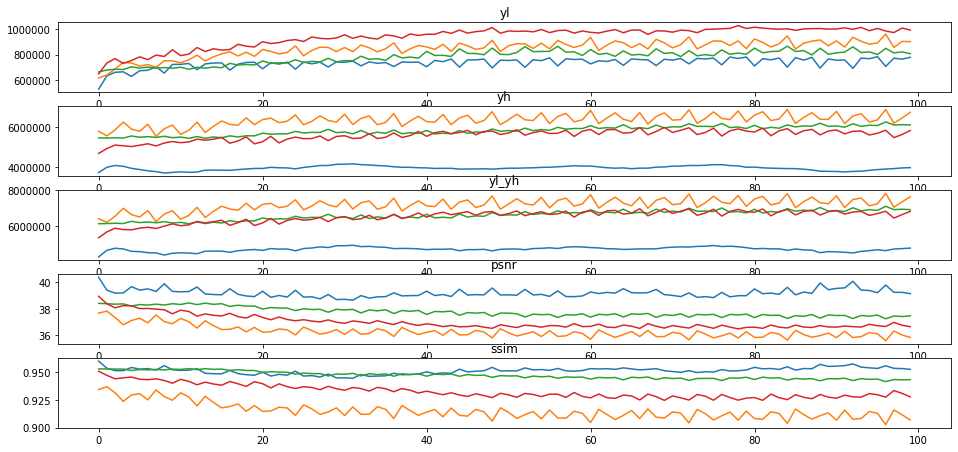

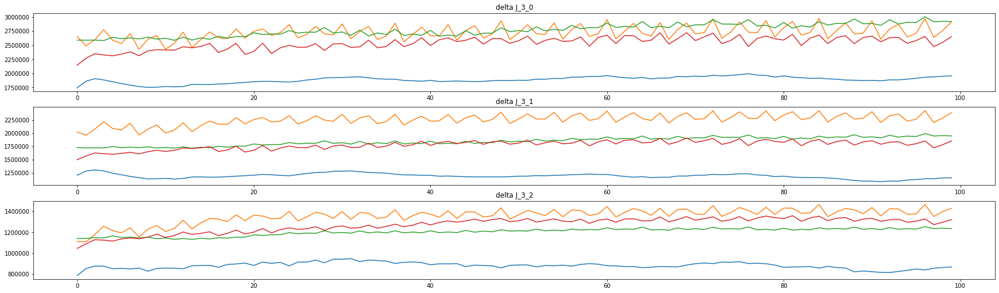

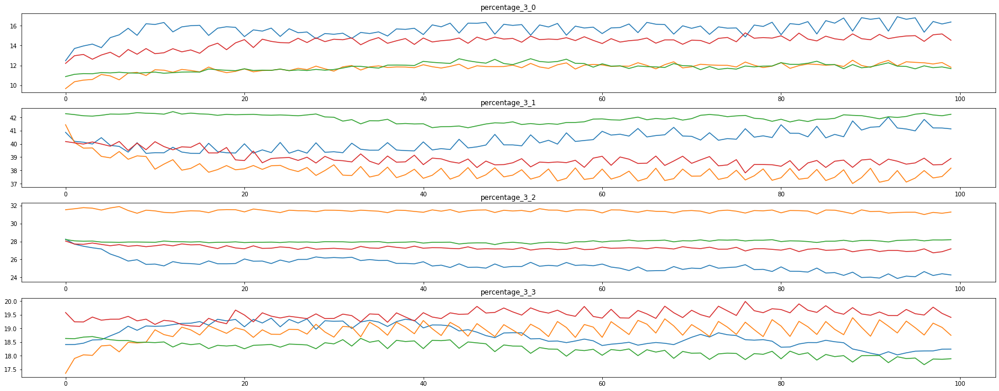

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40001.png]	[PSNR:35.278799407276324]	[SSIM:0.9368668224075394][yl: 400] 	 [yh: 663302.6875] 	 [yt: 9488081.875] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40002.png]	[PSNR:35.43537724498582]	[SSIM:0.9391370885414129][yl: 401] 	 [yh: 701420.1875] 	 [yt: 9077521.75] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40003.png]	[PSNR:35.21538125405718]	[SSIM:0.93636177761306][yl: 402] 	 [yh: 730223.5625] 	 [yt: 9404482.25] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40004.png]	[PSNR:34.94062777562503]	[SSIM:0.9312876088627536][yl: 403] 	 [yh: 766833.125] 	 [yt: 9857927.75] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40005.png]	[PSNR:34.999829953883]	[SSIM:0.9336779118818904][yl: 404] 	 [y

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40041.png]	[PSNR:34.96018557220231]	[SSIM:0.9318173331161395][yl: 440] 	 [yh: 900664.4375] 	 [yt: 9116754.75] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40042.png]	[PSNR:35.290390441690406]	[SSIM:0.9366504390184982][yl: 441] 	 [yh: 878785.75] 	 [yt: 8456134.375] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40043.png]	[PSNR:34.93425032660268]	[SSIM:0.9307728978933021][yl: 442] 	 [yh: 925146.875] 	 [yt: 9011994.75] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40044.png]	[PSNR:35.321069238703984]	[SSIM:0.9374518941207833][yl: 443] 	 [yh: 894080.0625] 	 [yt: 8308129.875] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40045.png]	[PSNR:35.044753168463984]	[SSIM:0.9335052325418434][yl: 444]

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40081.png]	[PSNR:34.8558007512148]	[SSIM:0.9273993563428926][yl: 480] 	 [yh: 976296.0625] 	 [yt: 8708340.375] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40082.png]	[PSNR:35.04477529400248]	[SSIM:0.930048360052723][yl: 481] 	 [yh: 961602.5] 	 [yt: 8405184.25] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40083.png]	[PSNR:34.872523821831834]	[SSIM:0.9274106022131673][yl: 482] 	 [yh: 973389.375] 	 [yt: 8683004.125] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40084.png]	[PSNR:35.13841833636328]	[SSIM:0.9309144661776337][yl: 483] 	 [yh: 953752.875] 	 [yt: 8230626.25] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40085.png]	[PSNR:34.93052830361969]	[SSIM:0.9278693602530422][yl: 484] 	 [yh

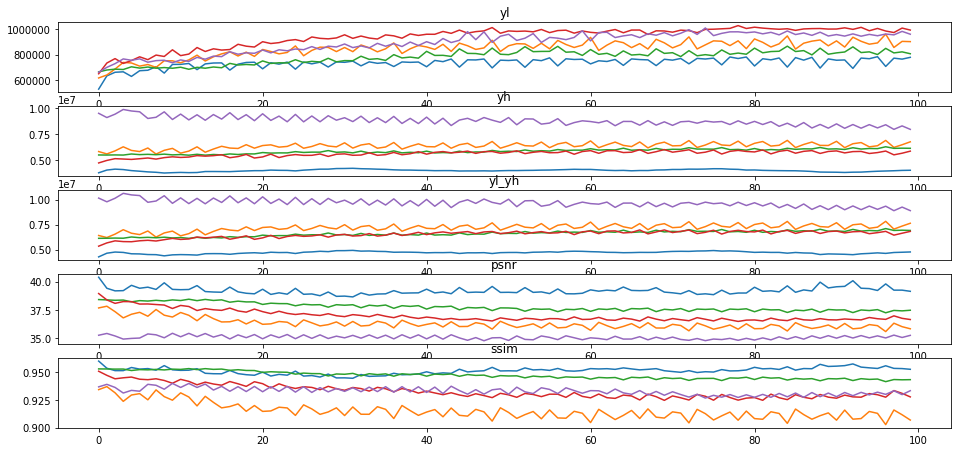

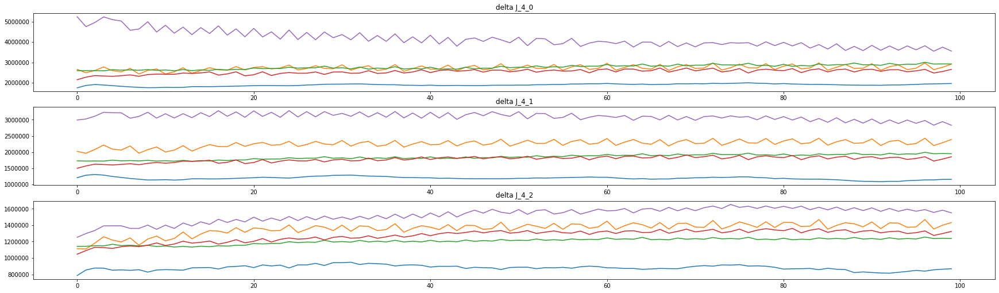

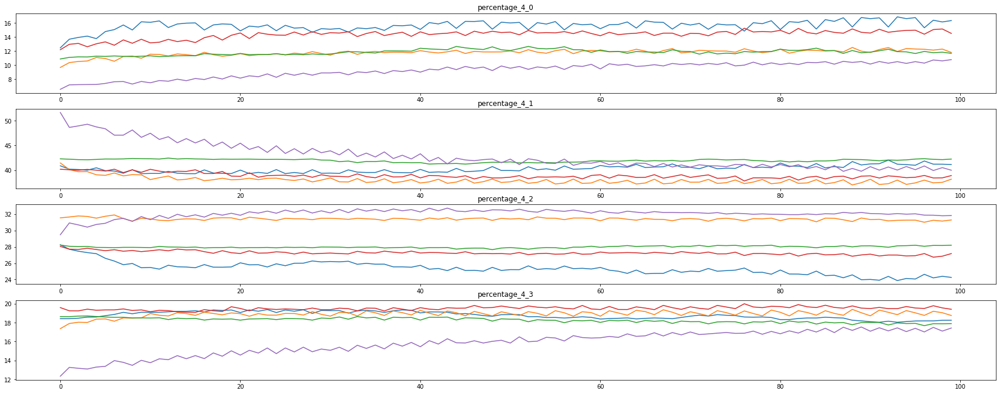

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40001.png]	[PSNR:35.87998518061413]	[SSIM:0.9208440524067301][yl: 500] 	 [yh: 692855.375] 	 [yt: 8546331.75] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40002.png]	[PSNR:34.3176059114735]	[SSIM:0.8737588486421468][yl: 501] 	 [yh: 1020947.3125] 	 [yt: 9701949.75] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40003.png]	[PSNR:34.17979850734371]	[SSIM:0.8729238320430095][yl: 502] 	 [yh: 1022488.1875] 	 [yt: 9996817.25] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40004.png]	[PSNR:34.27093142809059]	[SSIM:0.8737832281729069][yl: 503] 	 [yh: 1049049.0] 	 [yt: 9647785.0] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40005.png]	[PSNR:34.715790210516005]	[SSIM:0.8909089878165931][yl: 504] 	 [yh: 9

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40041.png]	[PSNR:34.9244061828227]	[SSIM:0.8938062876345918][yl: 540] 	 [yh: 953929.25] 	 [yt: 8842840.875] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40042.png]	[PSNR:34.65291223182872]	[SSIM:0.8848232792654741][yl: 541] 	 [yh: 1052296.5] 	 [yt: 8801754.875] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40043.png]	[PSNR:34.62549718761227]	[SSIM:0.8844877700420667][yl: 542] 	 [yh: 1021029.5] 	 [yt: 9023351.75] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40044.png]	[PSNR:34.6551903495374]	[SSIM:0.8844739108800767][yl: 543] 	 [yh: 1055131.625] 	 [yt: 8809232.125] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40045.png]	[PSNR:34.88913668776658]	[SSIM:0.8926487917611201][yl: 544] 	 [yh: 9593

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40081.png]	[PSNR:34.762022384562705]	[SSIM:0.8886588703202444][yl: 580] 	 [yh: 1005931.1875] 	 [yt: 8849836.625] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40082.png]	[PSNR:34.65803108773213]	[SSIM:0.8844545077369574][yl: 581] 	 [yh: 1072407.5] 	 [yt: 8674149.625] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40083.png]	[PSNR:34.58285853341019]	[SSIM:0.8815451086883][yl: 582] 	 [yh: 1054020.125] 	 [yt: 8948561.375] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40084.png]	[PSNR:34.679484186156174]	[SSIM:0.8853007217167771][yl: 583] 	 [yh: 1073235.875] 	 [yt: 8667366.25] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40085.png]	[PSNR:34.77619790191362]	[SSIM:0.8893279823420358][yl: 584] 	 [yh

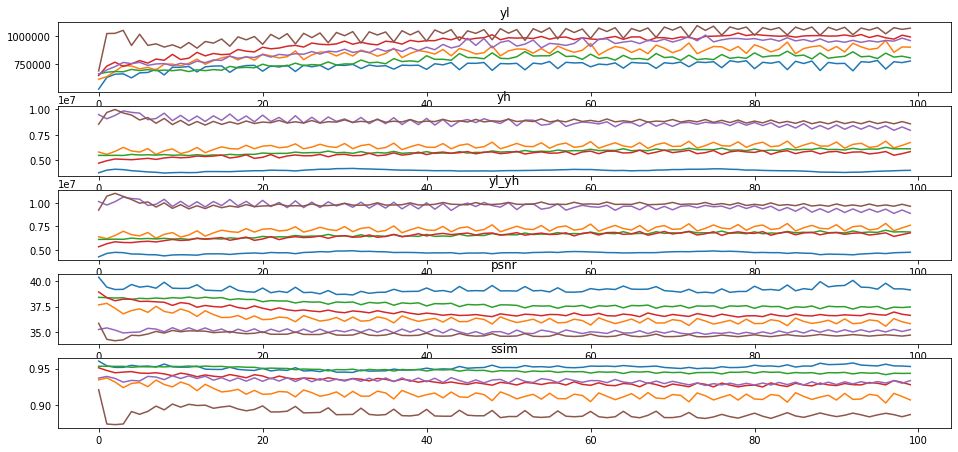

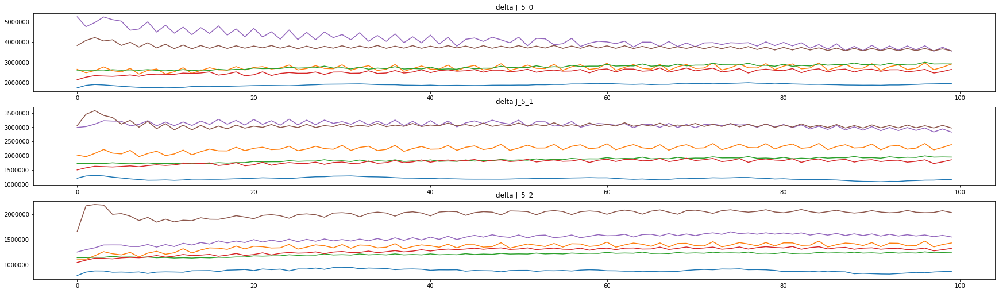

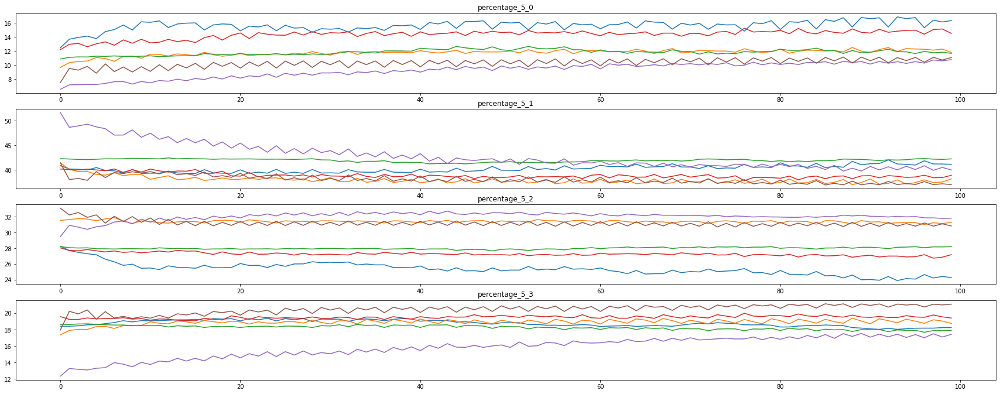

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40001.png]	[PSNR:37.96063615966927]	[SSIM:0.9526995531423892][yl: 600] 	 [yh: 621905.8125] 	 [yt: 5583667.75] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40002.png]	[PSNR:37.09021890655685]	[SSIM:0.943335442378813][yl: 601] 	 [yh: 747644.8125] 	 [yt: 6159000.25] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40003.png]	[PSNR:36.598262606589465]	[SSIM:0.937351178231396][yl: 602] 	 [yh: 760720.8125] 	 [yt: 6776308.375] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40004.png]	[PSNR:36.708785710717834]	[SSIM:0.9384525401855397][yl: 603] 	 [yh: 794133.5] 	 [yt: 6462088.875] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40005.png]	[PSNR:36.522829007397426]	[SSIM:0.9357957289456877][yl: 604] 	 [yh:

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40041.png]	[PSNR:35.819502349686246]	[SSIM:0.922689587935632][yl: 640] 	 [yh: 885675.3125] 	 [yt: 7678305.375] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40042.png]	[PSNR:36.187007772996786]	[SSIM:0.9292093970607942][yl: 641] 	 [yh: 879544.375] 	 [yt: 7028149.625] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40043.png]	[PSNR:35.843041386239626]	[SSIM:0.9227844490085758][yl: 642] 	 [yh: 875136.875] 	 [yt: 7676539.25] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40044.png]	[PSNR:36.144867070079925]	[SSIM:0.9285674142877064][yl: 643] 	 [yh: 879677.0] 	 [yt: 7060696.125] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40045.png]	[PSNR:35.81883730271795]	[SSIM:0.9221506248397577][yl: 644] 	 [yh

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40081.png]	[PSNR:35.75444699508693]	[SSIM:0.9205873033540514][yl: 680] 	 [yh: 910515.5] 	 [yt: 7648035.125] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40082.png]	[PSNR:36.12398911525809]	[SSIM:0.9280218754871445][yl: 681] 	 [yh: 908931.0625] 	 [yt: 6958864.875] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40083.png]	[PSNR:35.7843846875599]	[SSIM:0.9216942691443026][yl: 682] 	 [yh: 910817.8125] 	 [yt: 7583690.5] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40084.png]	[PSNR:36.163148646662975]	[SSIM:0.9286848028918425][yl: 683] 	 [yh: 912372.0625] 	 [yt: 6914979.375] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40085.png]	[PSNR:35.80318518847744]	[SSIM:0.9216434121546262][yl: 684] 	 [yh: 

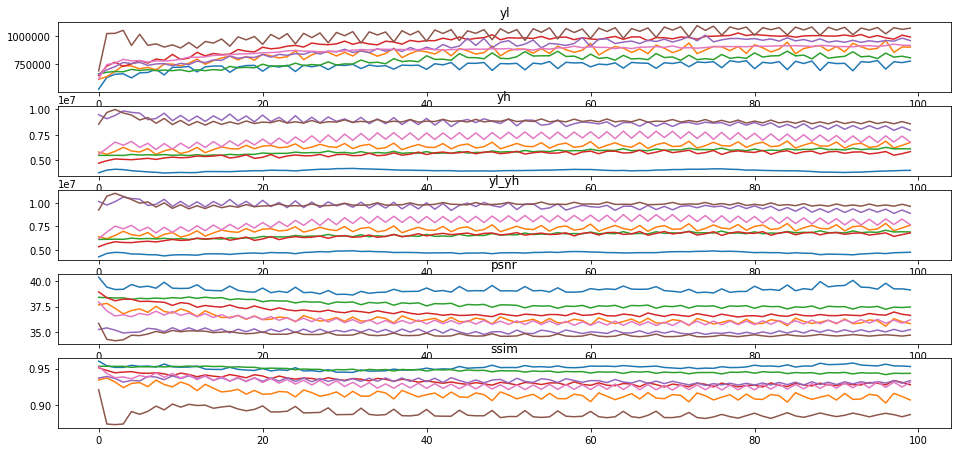

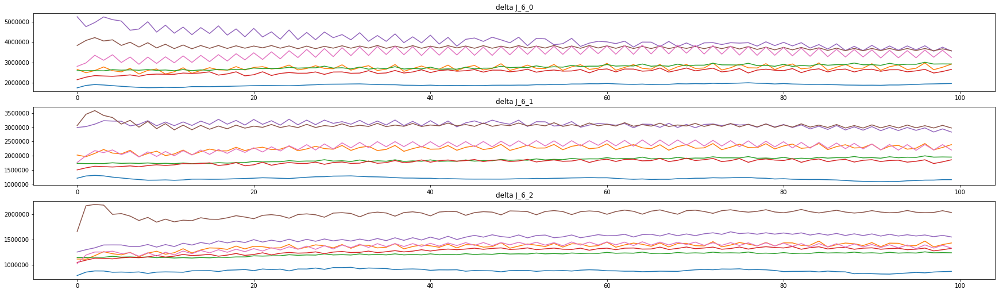

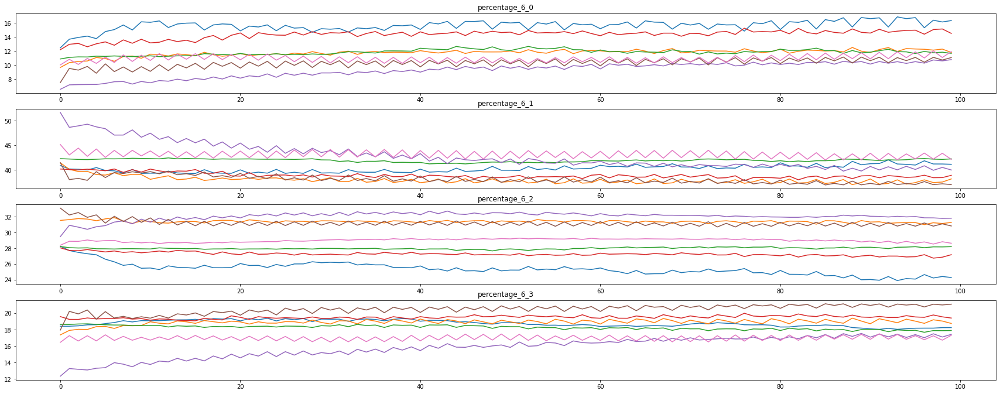

In [44]:
vcodec = 'libx264'

J = 3 # level of decomposition

if vcodec == 'libx264':
#         hr_test_dir = os.path.join(os.path.join(Flags.test_dir, "AVC"), 'original')
#         hr_test_frames_dir = os.path.join(os.path.join(Flags.test_dir, "AVC"), 'test_frames')
#         lr_test_dir = os.path.join(os.path.join(Flags.test_dir, "AVC"), 'qp'+str(Flags.qp))
#         lr_test_frames_dir = os.path.join(os.path.join(Flags.test_dir, "AVC"), 'test_frames_qp'+str(Flags.qp))
    hr_test_frames_dir = 'D:\\Github\\FYP2020\\test_sequence\\AVC\\test_frames'
    lr_test_frames_dir = 'D:\\Github\\FYP2020\\test_sequence\\AVC\\test_frames_qp37'

#     if Flags.vcodec == 'libx265':
#         hr_test_dir = os.path.join(os.path.join(Flags.test_dir, "HEVC"), 'original')
#         hr_test_frames_dir = os.path.join(os.path.join(Flags.test_dir, "HEVC"), 'test_frames')
#         lr_test_dir = os.path.join(os.path.join(Flags.test_dir, "HEVC"), 'qp'+str(Flags.qp))
#         lr_test_frames_dir = os.path.join(os.path.join(Flags.test_dir, "HEVC"), 'test_frames_qp'+str(Flags.qp))
# process the number of images in the file
print(lr_test_frames_dir)
total_test_images = 0
test_image_name_list = []
for filename in os.listdir(lr_test_frames_dir):
    if('.png' in filename):
        test_image_name_list.append(filename)
        total_test_images += 1
print(len(test_image_name_list))
log_file = os.path.join('.', "dwt_stats.txt")
touch(log_file)
print(log_file)
psnr_stats_list = []
ssim_stats_list = []

#     with open(log_file, 'w') as f:
# xfm = DTCWTForward(J=3)
# ifm = DTCWTInverse()
xfm = DTCWTForward(J=J, biort='near_sym_b', qshift='qshift_b').cuda()
ifm = DTCWTInverse( biort='near_sym_b', qshift='qshift_b').cuda()

delta_dctwt_yl = []
delta_dctwt_yh = []
delta_dctwt_yh_J = []
delta_dctwt_yl_yh = []
delta_dctwt_yh_J_p = []
psnr_stats_list = []
ssim_stats_list = []

temp_delta_dctwt_yl = []
temp_delta_dctwt_yh = []
temp_delta_dctwt_yh_J = [[] for _ in range(J)]
temp_delta_dctwt_yl_yh = []
print(len(temp_delta_dctwt_yh_J))
temp_delta_dctwt_yh_J_p = [[] for _ in range(J+1)]
temp_psnr_stats_list = []
temp_ssim_stats_list = []

yl_input, yh_input = None, None
for t in range( len(test_image_name_list) ):
    with open(log_file, 'w') as f:
        input_image_path = os.path.join(lr_test_frames_dir, test_image_name_list[t])
        input_image = cv2.imread(input_image_path, cv2.IMREAD_UNCHANGED)
        h,w,c = input_image.shape
        input_yuv_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2YUV)
        y_input, _, _ = cv2.split(input_yuv_image)
        # input_image = np.expand_dims(y_input, axis=2)

        gt_image_path = os.path.join(hr_test_frames_dir, test_image_name_list[t])
        gt_image = cv2.imread(gt_image_path, cv2.IMREAD_UNCHANGED)
        h,w,c = gt_image.shape
        gt_yuv_image = cv2.cvtColor(gt_image, cv2.COLOR_RGB2YUV)
        y_gt, _, _ = cv2.split(gt_yuv_image)

#         fig = plt.figure()
#         ax = fig.add_subplot(121)
#         ax.imshow(y_input, cmap=plt.get_cmap('gray'))
#         ax = fig.add_subplot(122)
#         ax.imshow(y_gt, cmap=plt.get_cmap('gray'))
#         plt.show()

        y_input_4D = y_input[np.newaxis,np.newaxis,:,:]
    #     print(y_input_4D.shape)
        y_gt_4D = y_gt[np.newaxis,np.newaxis,:,:]

    #         break
        img_input = torch.from_numpy(y_input_4D).float().cuda()
        img_gt = torch.from_numpy(y_gt_4D).float().cuda()
        

        yl_input, yh_input = xfm(img_input)
        yl_gt, yh_gt = xfm(img_gt)

        yl_diff = np.sum(np.abs(yl_gt.detach().cpu().numpy() - yl_input.detach().cpu().numpy()))
        yh_diff = 0.0
        for i, _ in enumerate(yh_input):
            diff = np.sum(np.abs(yh_input[i].detach().cpu().numpy() - yh_gt[i].detach().cpu().numpy()))
            temp_delta_dctwt_yh_J[i].append(diff)
            yh_diff += diff

        for i, _ in enumerate([yl_input] + yh_input):
            if i == 0:
                temp_delta_dctwt_yh_J_p[i].append(yl_diff/(yl_diff+yh_diff)*100)
            else:
                temp_delta_dctwt_yh_J_p[i].append(temp_delta_dctwt_yh_J[i-1][-1]/(yl_diff+yh_diff)*100)
        
        psnr_value = psnr(y_gt,y_input)
        ssim_value = ssim(y_gt,y_input)

        logmsg = ("[" + input_image_path + "]\t[PSNR:" + str(psnr_value) + "]\t[SSIM:"+ str(ssim_value) + "]")
        logmsg += ("[yl: {}] \t [yh: {}] \t [yt: {}] \n".format(t, yl_diff, yh_diff, yl_diff + yh_diff))
        print(logmsg)
        f.write(logmsg)
        f.flush()
#         print("[img_{}] yl: {} \t yh: {} \t total: {}".format(t, yl_diff, yh_diff, yl_diff + yh_diff))

        temp_delta_dctwt_yl.append(yl_diff)
        temp_delta_dctwt_yh.append(yh_diff)
        temp_delta_dctwt_yl_yh.append(yl_diff + yh_diff)
        temp_psnr_stats_list.append(psnr_value)
        temp_ssim_stats_list.append(ssim_value)

        if ( (t+1) % 100 == 0):
            delta_dctwt_yl.append(temp_delta_dctwt_yl)
            delta_dctwt_yh.append(temp_delta_dctwt_yh)
            delta_dctwt_yl_yh.append(temp_delta_dctwt_yl_yh)
            delta_dctwt_yh_J_p.append(temp_delta_dctwt_yh_J_p)
            delta_dctwt_yh_J.append(temp_delta_dctwt_yh_J)
#             print(len(delta_dctwt_yh_J))
#             print(len(delta_dctwt_yh_J[0]))
#             print(len(delta_dctwt_yh_J[0][0]))
            
            psnr_stats_list.append(temp_psnr_stats_list)
            ssim_stats_list.append(temp_ssim_stats_list)
            fig = plt.figure()
            ax = fig.add_subplot(611)
            for yl in delta_dctwt_yl:
                ax.plot(list(range(len(yl))), yl)
            plt.title("yl")
            ax = fig.add_subplot(612)
            for yh in delta_dctwt_yh:
                ax.plot(list(range(len(yh))), yh)
            plt.title("yh")
            ax = fig.add_subplot(613)
            for yt in delta_dctwt_yl_yh:
                ax.plot(list(range(len(yt))), yt)
            plt.title("yl_yh")
            ax = fig.add_subplot(614)
            for ps in psnr_stats_list:
                ax.plot(list(range(len(ps))), ps)
            plt.title("psnr")
            ax = fig.add_subplot(615)
            for ss in ssim_stats_list:
                ax.plot(list(range(len(ss))), ss)
            plt.title("ssim")
            plt.show()
            
#             ax = fig.add_subplot(616)
            fig2 = plt.figure(figsize=(30,300))
            for j, tmp in enumerate(delta_dctwt_yh_J[0]):
                ax = fig2.add_subplot(len(tmp),1,j+1)
                for i, yhj in enumerate(delta_dctwt_yh_J):
#                     print(yhj)
                    ax.plot(list(range(len(delta_dctwt_yh_J[i][j]))), delta_dctwt_yh_J[i][j])
                plt.title("delta J_{}_{}".format(i,j))
            plt.show()

            fig3 = plt.figure(figsize=(30,300))
            for j, tmp in enumerate(delta_dctwt_yh_J_p[0]):
                ax = fig3.add_subplot(len(tmp),1,j+1)
                for i, yhj in enumerate(delta_dctwt_yh_J_p):
#                     print(yhj)
                    ax.plot(list(range(len(delta_dctwt_yh_J_p[i][j]))), delta_dctwt_yh_J_p[i][j])
                plt.title("percentage_{}_{}".format(i,j))
            plt.show()

            temp_delta_dctwt_yl = []
            temp_delta_dctwt_yh = []
            temp_delta_dctwt_yh_J = [[] for _ in range(J)]
            temp_delta_dctwt_yl_yh = []
#             print(len(temp_delta_dctwt_yh_J))
            temp_delta_dctwt_yh_J_p = [[] for _ in range(J+1)]
            temp_psnr_stats_list = []
            temp_ssim_stats_list = []
            
        
#     if (t < 10):
#         diff = yl_gt.numpy() - yl_input.numpy()
#         fig = plt.figure()
#         ax = fig.add_subplot(131)
#         ax.imshow(yl_gt.numpy()[0,0,:,:], cmap=plt.get_cmap('gray'))
#         ax = fig.add_subplot(132)
#         ax.imshow(yl_input.numpy()[0,0,:,:], cmap=plt.get_cmap('gray'))
#         ax = fig.add_subplot(133)
#         ax.imshow(diff[0,0,:,:], cmap=plt.get_cmap('gray'))
#         plt.show()
#     break
    
#     # Create 12 outputs, one for the real and imaginary point spread functions
#     # for each of the 6 orientations
#     out_input = np.zeros((12,h,w))

    
#     # Can now plot the output
#     for b in range(6):
#         for ri in range(2):
#             yh[2][0,0,b,4,4,ri] = 1
#             out_input[b*2 + ri] = ifm((yl, yh))
#             yh[2][0,0,b,4,4,ri] = 0
            
#     fig = plt.figure()
#     for i in range(12):
#         ax = fig.add_subplot(3,4,i+1)
#         ax.imshow(out_input[i,:,:], cmap=plt.get_cmap('gray'))
#         plt.show()

In [52]:
for j, tmp in enumerate(delta_dctwt_yh_J[0]):
#     ax = fig2.add_subplot(len(tmp),1,j+1)
    print("j:", j)
    for i, yhj in enumerate(delta_dctwt_yh_J):
#         ax.plot(list(range(len(delta_dctwt_yh_J[i][j]))), delta_dctwt_yh_J[i][j])
        min_ = np.min(delta_dctwt_yh_J[i][j])
        max_ = np.max(delta_dctwt_yh_J[i][j])
        mean_ = np.mean(delta_dctwt_yh_J[i][j])
        std_ = np.std(delta_dctwt_yh_J[i][j])
        print("min: %.1f \t max: %.1f \t mean: %.1f \t std: %.1f" % (min_, max_, mean_, std_))
        
#     plt.title("delta J_{}_{}".format(i,j))
plt.show()

j: 0
min: 1745293.0 	 max: 1995500.0 	 mean: 1889329.9 	 std: 55513.0
min: 2427132.0 	 max: 2975499.8 	 mean: 2727114.0 	 std: 125324.6
min: 2583204.2 	 max: 3004828.2 	 mean: 2769554.2 	 std: 108679.3
min: 2146295.8 	 max: 2721336.0 	 mean: 2536915.0 	 std: 111736.0
min: 3548617.2 	 max: 5244027.5 	 mean: 4142426.0 	 std: 391015.7
min: 3569343.8 	 max: 4217525.5 	 mean: 3746539.8 	 std: 113043.0
min: 2802035.5 	 max: 3849869.0 	 mean: 3450680.8 	 std: 259862.7
j: 1
min: 1083070.4 	 max: 1305619.1 	 mean: 1190540.8 	 std: 46077.1
min: 1963004.6 	 max: 2427715.2 	 mean: 2256723.5 	 std: 104936.3
min: 1715922.8 	 max: 1993103.4 	 mean: 1848491.9 	 std: 76571.0
min: 1498188.1 	 max: 1909489.8 	 mean: 1778685.8 	 std: 83720.4
min: 2830081.5 	 max: 3282812.5 	 mean: 3093181.5 	 std: 106002.4
min: 2907393.8 	 max: 3585863.2 	 mean: 3070816.0 	 std: 100080.8
min: 1760928.2 	 max: 2553347.2 	 mean: 2319564.5 	 std: 163416.2
j: 2
min: 786044.3 	 max: 948310.9 	 mean: 880647.7 	 std: 30337.7
min

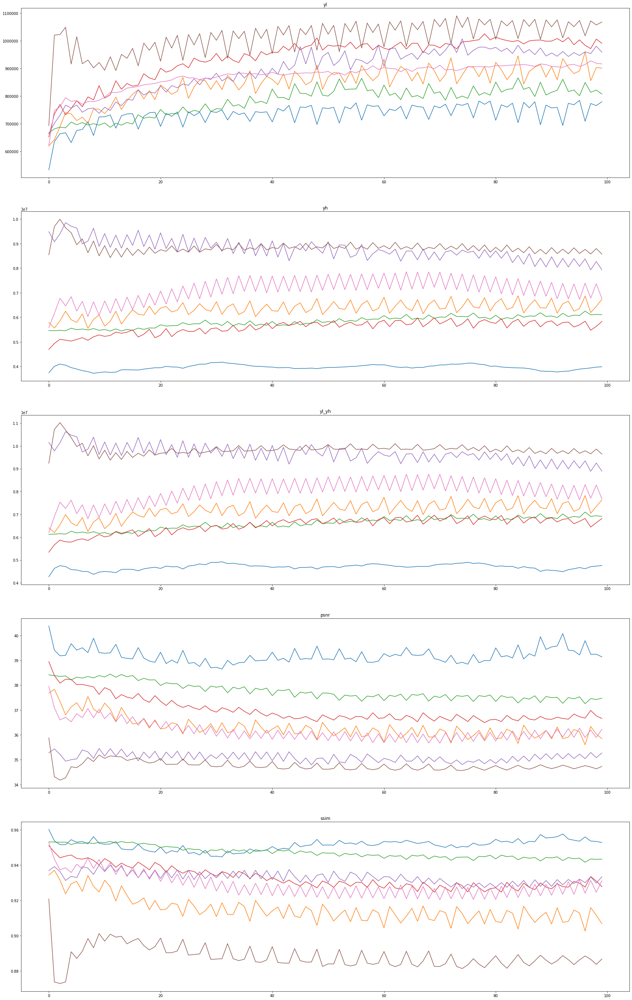

In [33]:
fig = plt.figure(figsize=(30,60))
ax = fig.add_subplot(611)
for yl in delta_dctwt_yl:
    ax.plot(list(range(len(yl))), yl)
plt.title("yl")
ax = fig.add_subplot(612)
for yh in delta_dctwt_yh:
    ax.plot(list(range(len(yh))), yh)
plt.title("yh")
ax = fig.add_subplot(613)
for yt in delta_dctwt_yl_yh:
    ax.plot(list(range(len(yt))), yt)
plt.title("yl_yh")
ax = fig.add_subplot(614)
for ps in psnr_stats_list:
    ax.plot(list(range(len(ps))), ps)
plt.title("psnr")
ax = fig.add_subplot(615)
for ss in ssim_stats_list:
    ax.plot(list(range(len(ss))), ss)
plt.title("ssim")
plt.show()

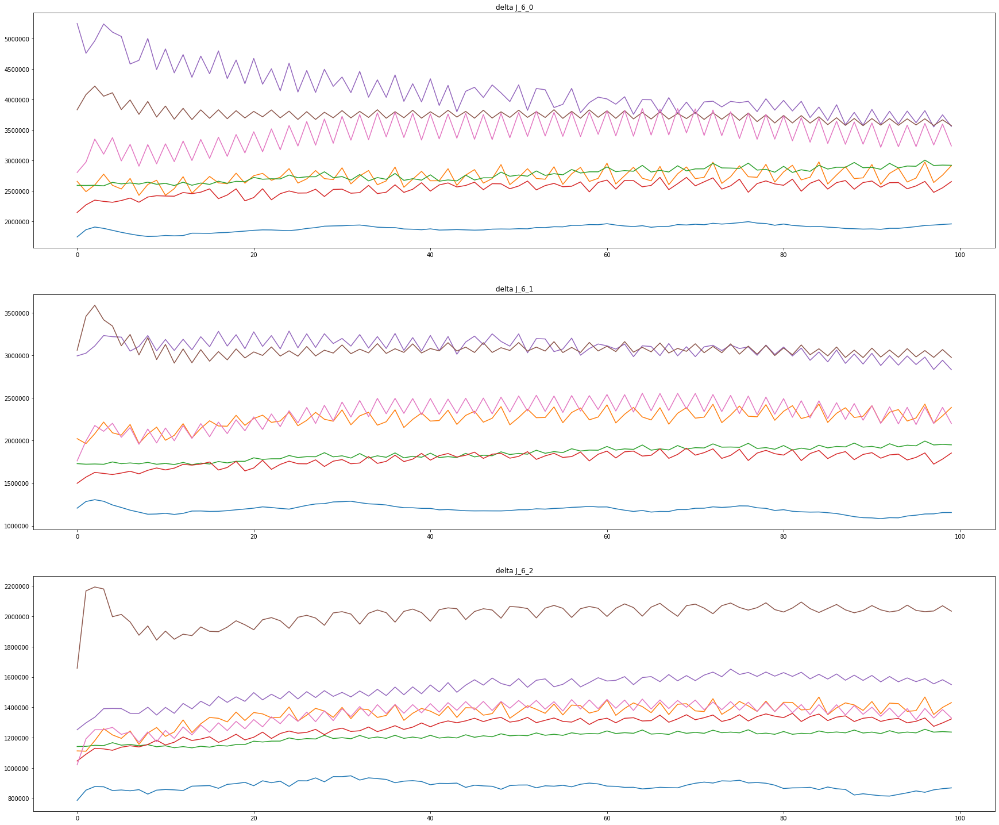

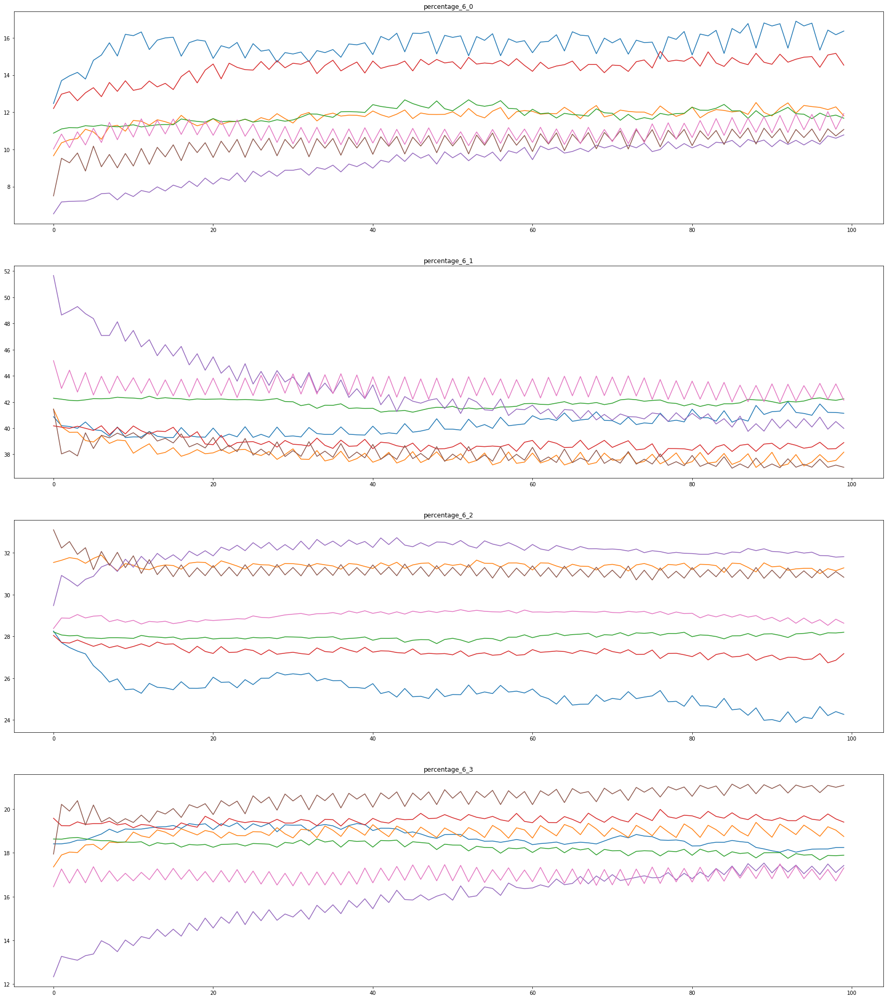

In [29]:
fig2 = plt.figure(figsize=(30,900))
for j, tmp in enumerate(delta_dctwt_yh_J[0]):
    ax = fig2.add_subplot(len(tmp),1,j+1)
    for i, yhj in enumerate(delta_dctwt_yh_J):
#                     print(yhj)
        ax.plot(list(range(len(delta_dctwt_yh_J[i][j]))), delta_dctwt_yh_J[i][j])
    plt.title("delta J_{}_{}".format(i,j))
plt.show()

fig3 = plt.figure(figsize=(30,900))
for j, tmp in enumerate(delta_dctwt_yh_J_p[0]):
    ax = fig3.add_subplot(len(tmp),1,j+1)
    for i, yhj in enumerate(delta_dctwt_yh_J_p):
#                     print(yhj)
        ax.plot(list(range(len(delta_dctwt_yh_J_p[i][j]))), delta_dctwt_yh_J_p[i][j])
    plt.title("percentage_{}_{}".format(i,j))
plt.show()

In [75]:
from pytorch_wavelets import DWTForward, DWTInverse # (or import DWT, IDWT)


xfm_ = DTCWTForward(J=j, biort='antonini', qshift='qshift_d').cuda()
ifm_ = DTCWTInverse( biort='antonini', qshift='qshift_d').cuda()
delta = []
for j in range(3,4):
    print(j)
#     xfm_ = DWTForward(J=j, mode='zero', wave='db4').cuda()  # Accepts all wave types available to PyWavelets
#     ifm_ = DWTInverse(mode='zero', wave='db4').cuda()
    xfm_ = DTCWTForward(J=j, biort='antonini', qshift='qshift_d').cuda()
    ifm_ = DTCWTInverse( biort='antonini', qshift='qshift_d').cuda()
    yl_gt_, yh_gt_ = xfm_(img_gt)
    yl_input_, yh_input_ = xfm_(img_input)
    
    for i, _ in enumerate(yh_input):
        delta.append(yh_gt_[i] - yh_input_[i])
    
#     img_rec = ifm_((yl_gt_, yh_gt_))
#     diff_img = (img_rec - img_gt)
#     print(np.mean(np.abs(diff_img.detach().cpu().numpy())))
#     print(np.max(diff_img.detach().cpu().numpy()))
#     print(np.min(diff_img.detach().cpu().numpy()))
#     print(np.mean(diff_img.detach().cpu().numpy()))
#     print(np.mean(diff_img.detach().cpu().numpy()**2))

3


In [93]:
def entropy(signal):
        '''
        function returns entropy of a signal
        signal must be a 1-D numpy array
        '''
        lensig=signal.size
        symset=list(set(signal))
        numsym=len(symset)
        propab=[np.size(signal[signal==i])/(1.0*lensig) for i in symset]
        ent=np.sum([p*np.log2(1.0/p) for p in propab])
        return ent
print(entropy(delta[0][0,0,x,:,:,y].detach().cpu().numpy().flatten()))

18.866668389380777


torch.Size([1, 1, 6, 540, 960, 2])


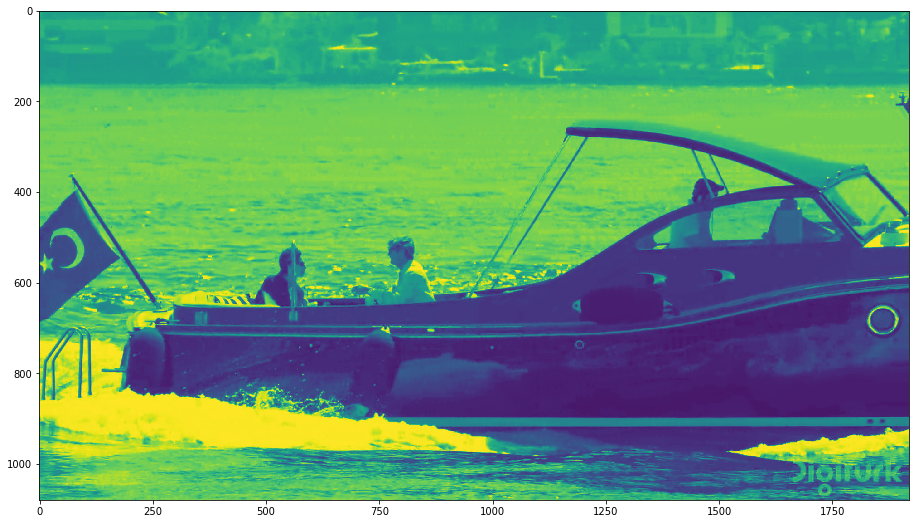

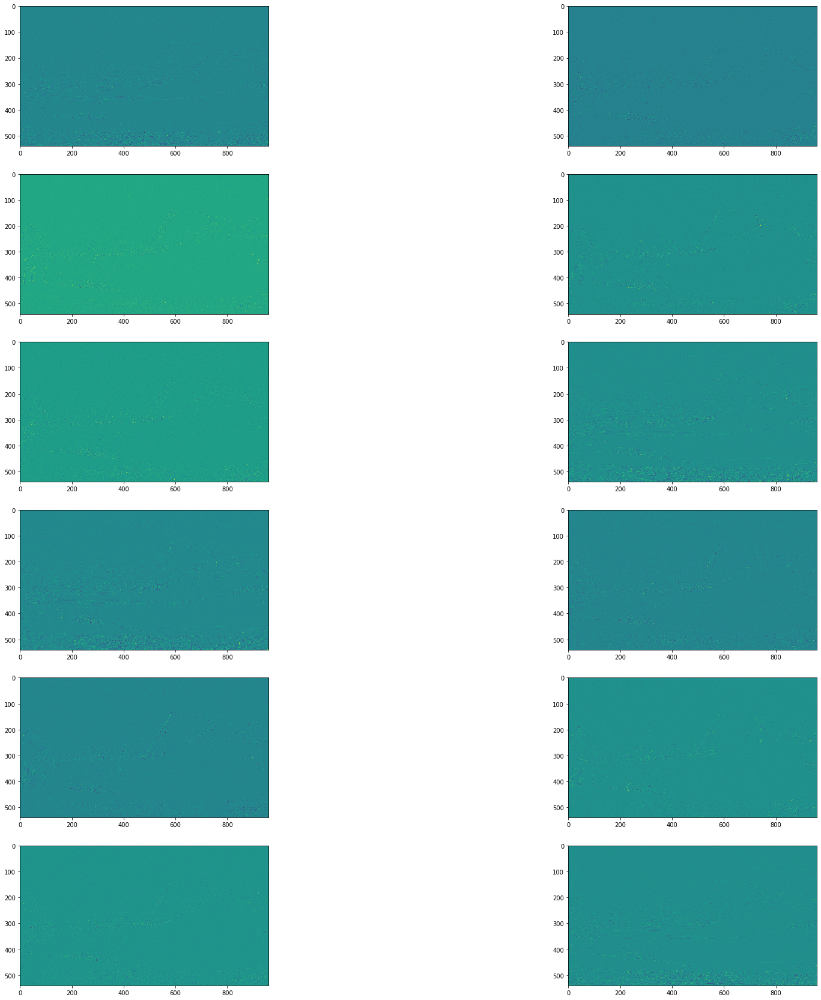

In [91]:
print(delta[0].shape)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.imshow(img_input[0,0,:,:].detach().cpu().numpy())
plt.show()

fig = plt.figure(figsize=[30,30])
i = 0
for y in range(2):
    for x in range(6):
        i = i+1
        ax = fig.add_subplot(6,2,i)
        ax.imshow(delta[0][0,0,x,:,:,y].detach().cpu().numpy())
plt.show()

D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37
700
.\dwt_stats.txt
3
[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40001.png]	[PSNR:40.37858735607854]	[SSIM:0.9602251167900638][yl: 4.10736083984375] 	 [yh: 3.07797908782959] 	 [yt: 7.18533992767334] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40002.png]	[PSNR:39.40780090468016]	[SSIM:0.9537469519634901][yl: 4.901031494140625] 	 [yh: 3.321030080318451] 	 [yt: 8.222061574459076] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40003.png]	[PSNR:39.179338515329974]	[SSIM:0.9515689043787834][yl: 5.118244647979736] 	 [yh: 3.4030204713344574] 	 [yt: 8.521265119314194] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40004.png]	[PSNR:39.198725097232575]	[SSIM:0.951579331201294][yl: 5.145545959472656] 	 [yh: 3.3839711248874664] 	 [yt: 8.529517084360123] 

[

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40037.png]	[PSNR:39.20000388310108]	[SSIM:0.949186825608722][yl: 5.462601661682129] 	 [yh: 3.4145154654979706] 	 [yt: 8.8771171271801] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40038.png]	[PSNR:38.97508910501195]	[SSIM:0.9478316810852742][yl: 5.735677242279053] 	 [yh: 3.4294729232788086] 	 [yt: 9.165150165557861] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40039.png]	[PSNR:38.99412323532027]	[SSIM:0.9480461430238177][yl: 5.712558746337891] 	 [yh: 3.4362283051013947] 	 [yt: 9.148787051439285] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40040.png]	[PSNR:39.00362033524412]	[SSIM:0.9485116722279577][yl: 5.7310357093811035] 	 [yh: 3.4159201085567474] 	 [yt: 9.146955817937851] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30f

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40073.png]	[PSNR:39.20104588712685]	[SSIM:0.9515479858480734][yl: 5.624083518981934] 	 [yh: 3.4185223281383514] 	 [yt: 9.042605847120285] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40074.png]	[PSNR:38.86513742425232]	[SSIM:0.9498597960693441][yl: 5.9492011070251465] 	 [yh: 3.449299454689026] 	 [yt: 9.398500561714172] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40075.png]	[PSNR:38.91951026538406]	[SSIM:0.9505833044008568][yl: 5.911635875701904] 	 [yh: 3.450019955635071] 	 [yt: 9.361655831336975] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_30fps_420_8bit_AVC_MP40076.png]	[PSNR:38.84424021832797]	[SSIM:0.9502876756662982][yl: 5.9665117263793945] 	 [yh: 3.4747862815856934] 	 [yt: 9.441298007965088] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Beauty_1920x1080_3

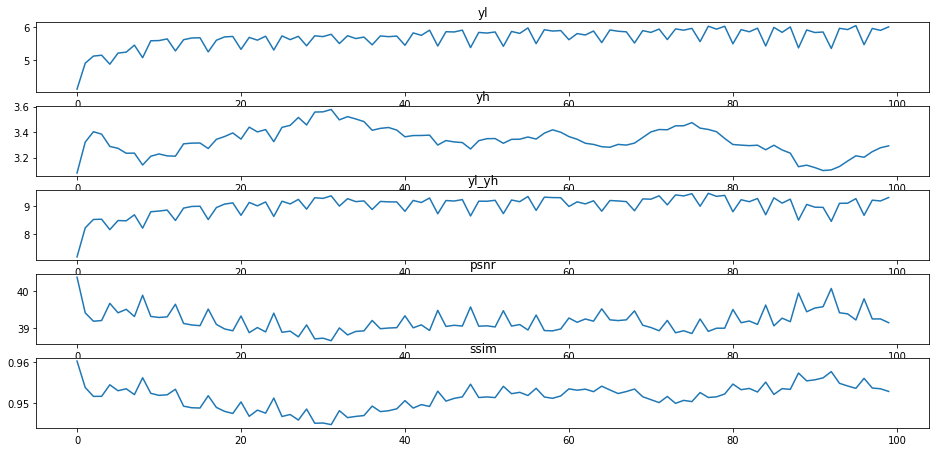

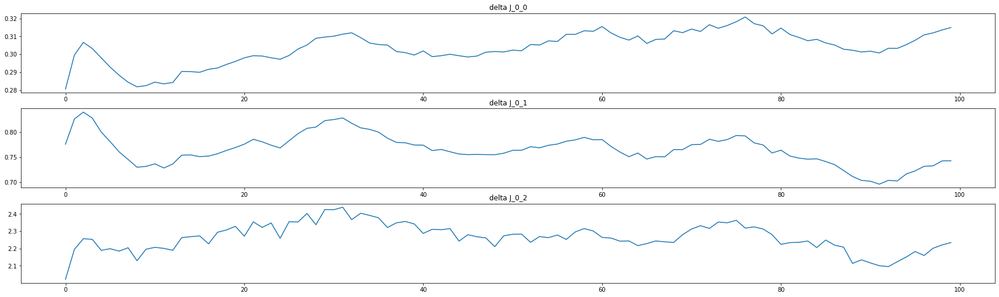

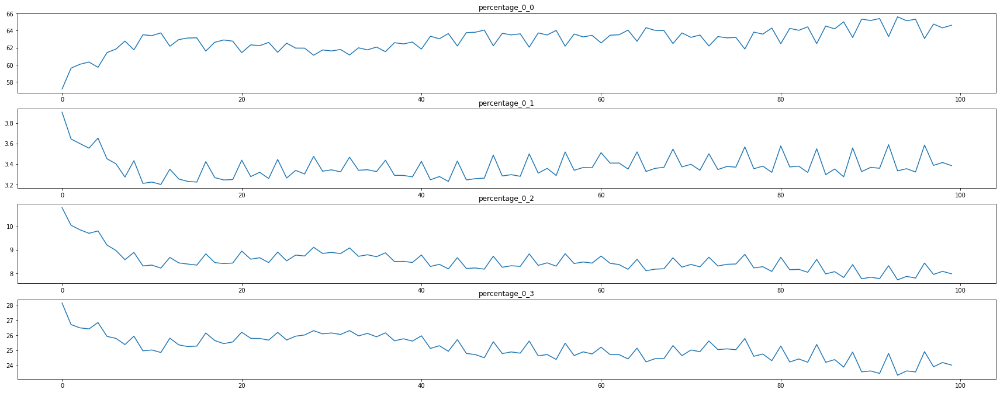

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40001.png]	[PSNR:37.67834126869575]	[SSIM:0.9343499251803252][yl: 4.777188777923584] 	 [yh: 4.588466972112656] 	 [yt: 9.36565575003624] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40002.png]	[PSNR:37.82980713043854]	[SSIM:0.9370822971256322][yl: 4.955209732055664] 	 [yh: 4.5181072652339935] 	 [yt: 9.473316997289658] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40003.png]	[PSNR:37.350819649502355]	[SSIM:0.9314894058714207][yl: 5.311435222625732] 	 [yh: 4.790426135063171] 	 [yt: 10.101861357688904] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40004.png]	[PSNR:36.80464028682096]	[SSIM:0.9237473817607335][yl: 5.707131862640381] 	 [yh: 5.108810663223267] 	 [yt: 10.815942525863647] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphor

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40036.png]	[PSNR:36.34986843878464]	[SSIM:0.9164998726737021][yl: 6.524131774902344] 	 [yh: 5.318934053182602] 	 [yt: 11.843065828084946] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40037.png]	[PSNR:35.92436664318836]	[SSIM:0.9081890509442491][yl: 6.876636028289795] 	 [yh: 5.626559674739838] 	 [yt: 12.503195703029633] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40038.png]	[PSNR:36.60288266671115]	[SSIM:0.9199747715859983][yl: 6.243790149688721] 	 [yh: 5.174649655818939] 	 [yt: 11.41843980550766] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40039.png]	[PSNR:36.304664147633055]	[SSIM:0.9153531188436026][yl: 6.523774147033691] 	 [yh: 5.377955347299576] 	 [yt: 11.901729494333267] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bospho

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40071.png]	[PSNR:36.23904889660217]	[SSIM:0.9142103263418554][yl: 6.579085826873779] 	 [yh: 5.429008811712265] 	 [yt: 12.008094638586044] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40072.png]	[PSNR:36.13417458018985]	[SSIM:0.9131032164145817][yl: 6.771651268005371] 	 [yh: 5.428750991821289] 	 [yt: 12.20040225982666] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40073.png]	[PSNR:35.66699742548701]	[SSIM:0.9042168546385744][yl: 7.2378668785095215] 	 [yh: 5.783257484436035] 	 [yt: 13.021124362945557] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphorus_1920x1080_30fps_420_8bit_AVC_MP40074.png]	[PSNR:36.34980075394768]	[SSIM:0.9164696443875875][yl: 6.514319896697998] 	 [yh: 5.323492586612701] 	 [yt: 11.8378124833107] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Bosphoru

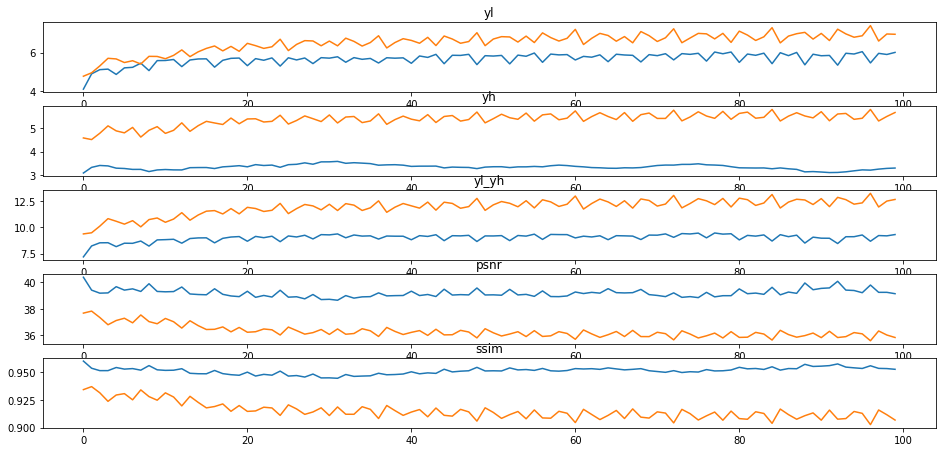

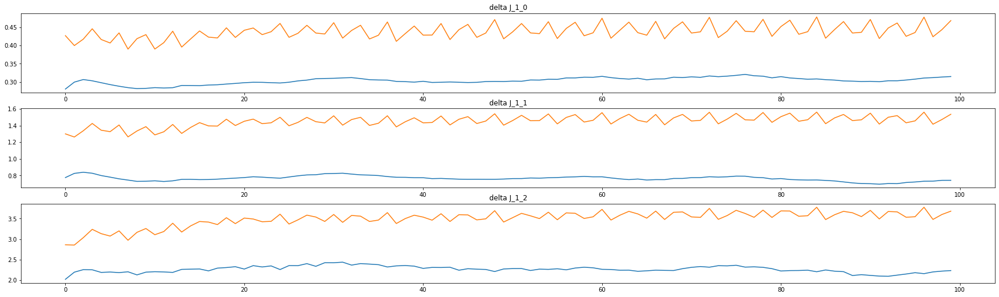

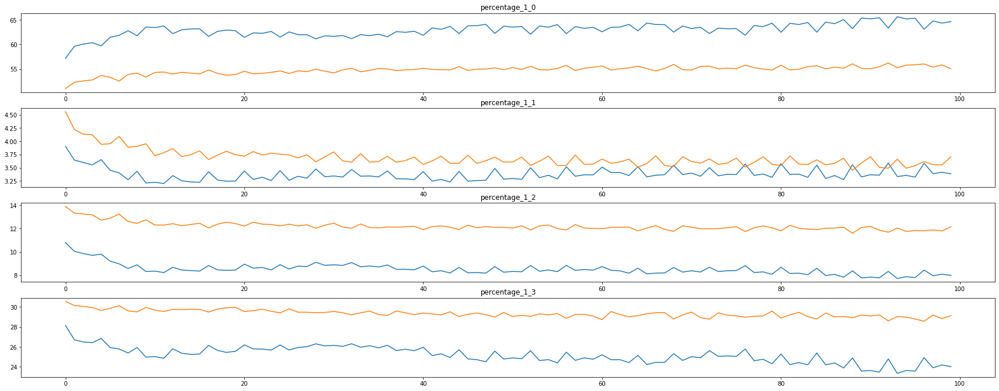

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40001.png]	[PSNR:38.413721759177236]	[SSIM:0.9531412187380952][yl: 5.13969087600708] 	 [yh: 4.463576376438141] 	 [yt: 9.603267252445221] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40002.png]	[PSNR:38.385212968850276]	[SSIM:0.9530701187681008][yl: 5.2538862228393555] 	 [yh: 4.462027132511139] 	 [yt: 9.715913355350494] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40003.png]	[PSNR:38.35071063375424]	[SSIM:0.952951745314837][yl: 5.304004192352295] 	 [yh: 4.481558859348297] 	 [yt: 9.785563051700592] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40004.png]	[PSNR:38.37065415783015]	[SSIM:0.953008763303112][yl: 5.283167839050293] 	 [yh: 4.4730382561683655] 	 [yt: 9.756206095218658] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40037.png]	[PSNR:37.64619224838173]	[SSIM:0.9465237902971689][yl: 6.173846244812012] 	 [yh: 4.765581548213959] 	 [yt: 10.93942779302597] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40038.png]	[PSNR:37.876351614197155]	[SSIM:0.9487282225546576][yl: 5.976873397827148] 	 [yh: 4.658891022205353] 	 [yt: 10.635764420032501] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40039.png]	[PSNR:37.813697264740924]	[SSIM:0.948031219839836][yl: 6.027212619781494] 	 [yh: 4.697056442499161] 	 [yt: 10.724269062280655] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40040.png]	[PSNR:37.87965700950879]	[SSIM:0.9486890205557178][yl: 5.9634480476379395] 	 [yh: 4.664805322885513] 	 [yt: 10.628253370523453] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40073.png]	[PSNR:37.36650760015138]	[SSIM:0.9427335346709034][yl: 6.412326812744141] 	 [yh: 4.947413414716721] 	 [yt: 11.359740227460861] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40074.png]	[PSNR:37.58005159328828]	[SSIM:0.9444476958358324][yl: 6.10447883605957] 	 [yh: 4.868195563554764] 	 [yt: 10.972674399614334] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40075.png]	[PSNR:37.547405192092846]	[SSIM:0.9445029638350999][yl: 6.172468662261963] 	 [yh: 4.879027336835861] 	 [yt: 11.051495999097824] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_1920x1080_30fps_420_8bit_AVC_MP40076.png]	[PSNR:37.585964616216415]	[SSIM:0.9445805686525942][yl: 6.108517169952393] 	 [yh: 4.863149076700211] 	 [yt: 10.971666246652603] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\HoneyBee_

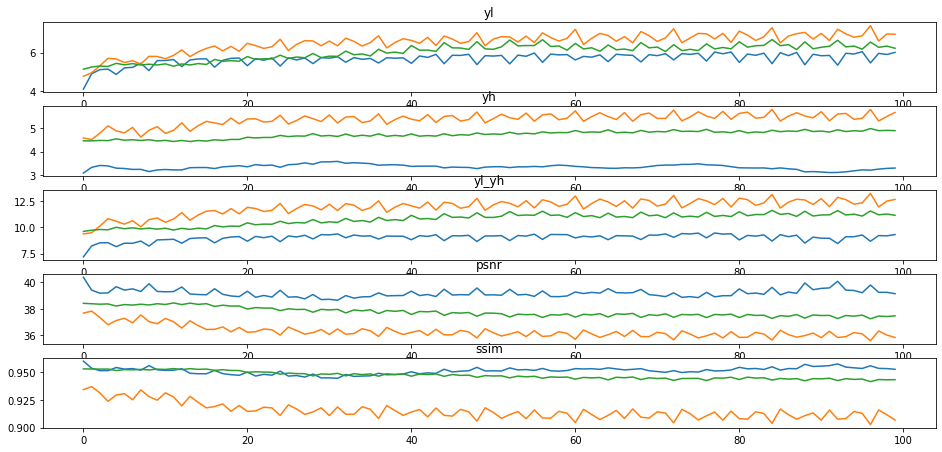

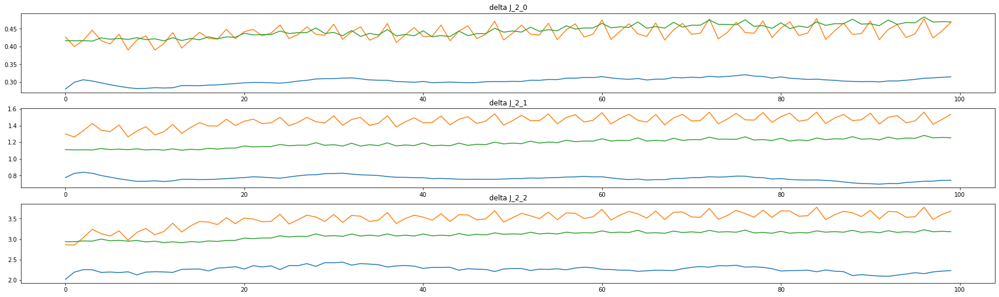

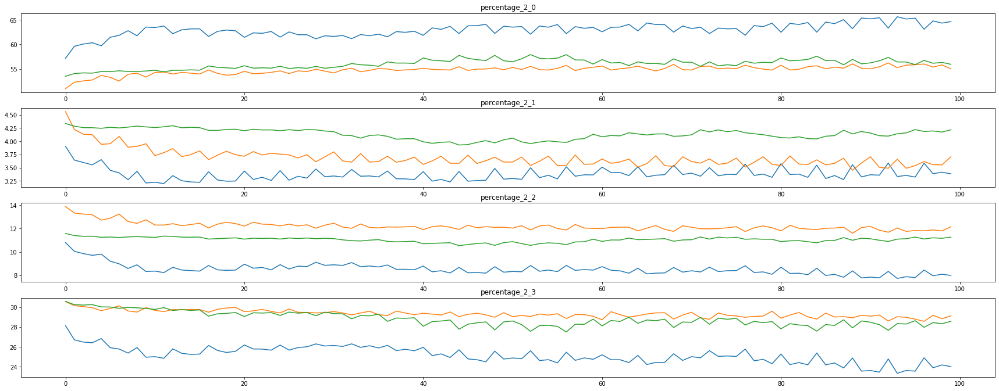

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40001.png]	[PSNR:38.9440493289547]	[SSIM:0.9510231985704545][yl: 5.028003692626953] 	 [yh: 3.9984631836414337] 	 [yt: 9.026466876268387] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40002.png]	[PSNR:38.38403191092229]	[SSIM:0.9473131717195423][yl: 5.671360969543457] 	 [yh: 4.179195702075958] 	 [yt: 9.850556671619415] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40003.png]	[PSNR:38.08045632206601]	[SSIM:0.9441709957209355][yl: 5.936469078063965] 	 [yh: 4.328508079051971] 	 [yt: 10.264977157115936] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40004.png]	[PSNR:38.23728922405848]	[SSIM:0.9450818627157266][yl: 5.645865440368652] 	 [yh: 4.307427108287811] 	 [yt: 9.953292548656464] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fp

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40037.png]	[PSNR:36.82223385594999]	[SSIM:0.9324376257860617][yl: 7.299323558807373] 	 [yh: 4.881586134433746] 	 [yt: 12.18090969324112] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40038.png]	[PSNR:37.03415589284438]	[SSIM:0.9353218462631435][yl: 7.158202171325684] 	 [yh: 4.750432878732681] 	 [yt: 11.908635050058365] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40039.png]	[PSNR:36.863950667610474]	[SSIM:0.9338026618617022][yl: 7.414697647094727] 	 [yh: 4.816681802272797] 	 [yt: 12.231379449367523] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40040.png]	[PSNR:36.7544481812373]	[SSIM:0.9312277159982875][yl: 7.324521064758301] 	 [yh: 4.94725027680397] 	 [yt: 12.271771341562271] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30f

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40073.png]	[PSNR:36.55477592371429]	[SSIM:0.924943351196411][yl: 7.611212253570557] 	 [yh: 5.128779590129852] 	 [yt: 12.739991843700409] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40074.png]	[PSNR:36.82378878618481]	[SSIM:0.9299709498417973][yl: 7.490171909332275] 	 [yh: 4.918552935123444] 	 [yt: 12.408724844455719] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40075.png]	[PSNR:36.68334536572081]	[SSIM:0.9283602800935391][yl: 7.685627460479736] 	 [yh: 4.98682901263237] 	 [yt: 12.672456473112106] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30fps_420_8bit_AVC_MP40076.png]	[PSNR:36.53586376224287]	[SSIM:0.9247647216554573][yl: 7.697019577026367] 	 [yh: 5.127805948257446] 	 [yt: 12.824825525283813] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Jockey_1920x1080_30f

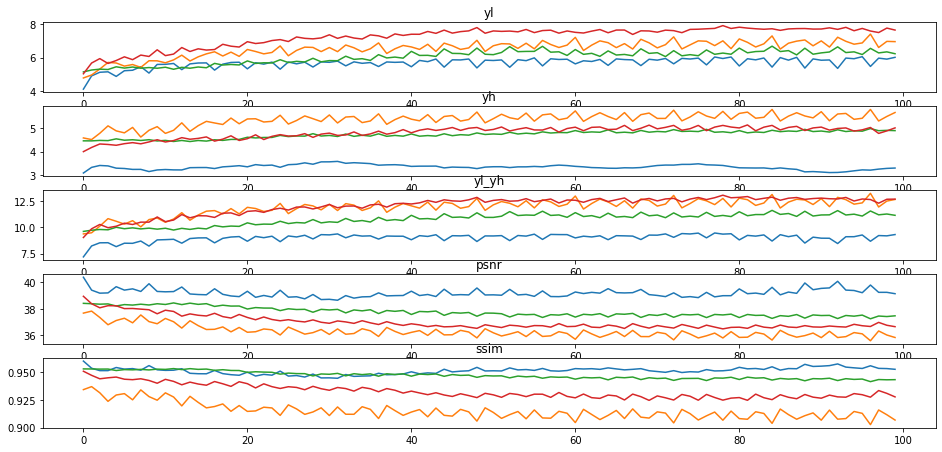

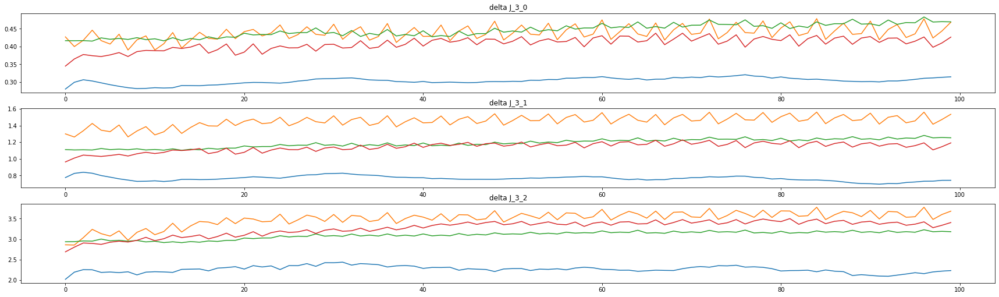

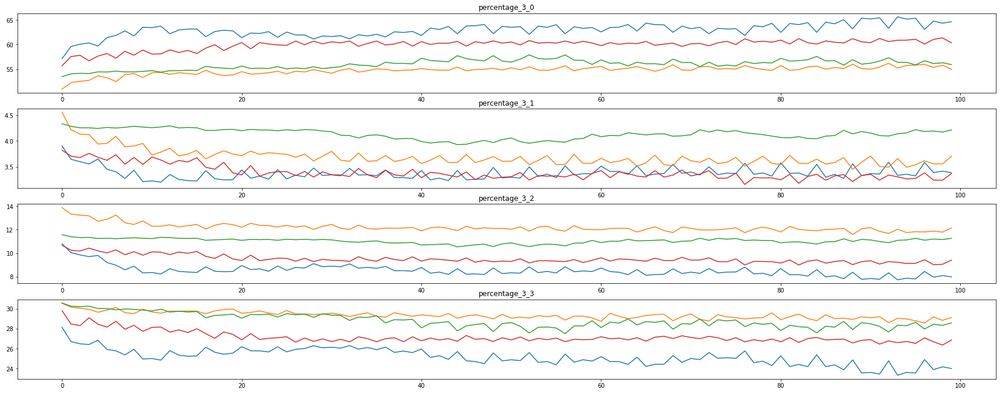

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40001.png]	[PSNR:35.278799407276324]	[SSIM:0.9368668224075394][yl: 5.118076324462891] 	 [yh: 5.987215340137482] 	 [yt: 11.105291664600372] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40002.png]	[PSNR:35.43537724498582]	[SSIM:0.9391370885414129][yl: 5.4121928215026855] 	 [yh: 6.045993685722351] 	 [yt: 11.458186507225037] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40003.png]	[PSNR:35.21538125405718]	[SSIM:0.93636177761306][yl: 5.634440898895264] 	 [yh: 6.229897499084473] 	 [yt: 11.864338397979736] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40004.png]	[PSNR:34.94062777562503]	[SSIM:0.9312876088627536][yl: 5.916922092437744] 	 [yh: 6.49681293964386] 	 [yt: 12.413735032081604] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Rea

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40036.png]	[PSNR:35.28405374611459]	[SSIM:0.9370292442577975][yl: 6.677219867706299] 	 [yh: 6.428402423858643] 	 [yt: 13.105622291564941] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40037.png]	[PSNR:34.958980092898805]	[SSIM:0.9320218899352276][yl: 6.8323750495910645] 	 [yh: 6.744019269943237] 	 [yt: 13.576394319534302] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40038.png]	[PSNR:35.320476186505644]	[SSIM:0.9370526860983365][yl: 6.660247325897217] 	 [yh: 6.416951060295105] 	 [yt: 13.077198386192322] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40039.png]	[PSNR:35.022237059178934]	[SSIM:0.93228398491921][yl: 6.928401947021484] 	 [yh: 6.692884266376495] 	 [yt: 13.62128621339798] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\R

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40071.png]	[PSNR:35.1174582079608]	[SSIM:0.9324347408269443][yl: 7.300346374511719] 	 [yh: 6.57633912563324] 	 [yt: 13.876685500144958] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40072.png]	[PSNR:34.908435632988684]	[SSIM:0.9299140607587274][yl: 7.4556474685668945] 	 [yh: 6.775275409221649] 	 [yt: 14.230922877788544] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40073.png]	[PSNR:34.833067314460266]	[SSIM:0.9276009247889548][yl: 7.668351650238037] 	 [yh: 6.839818298816681] 	 [yt: 14.508169949054718] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ReadySetGo_1920x1080_30fps_420_8bit_AVC_MP40074.png]	[PSNR:34.99092007621405]	[SSIM:0.9301257951890654][yl: 7.385382175445557] 	 [yh: 6.7068591713905334] 	 [yt: 14.09224134683609] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\R

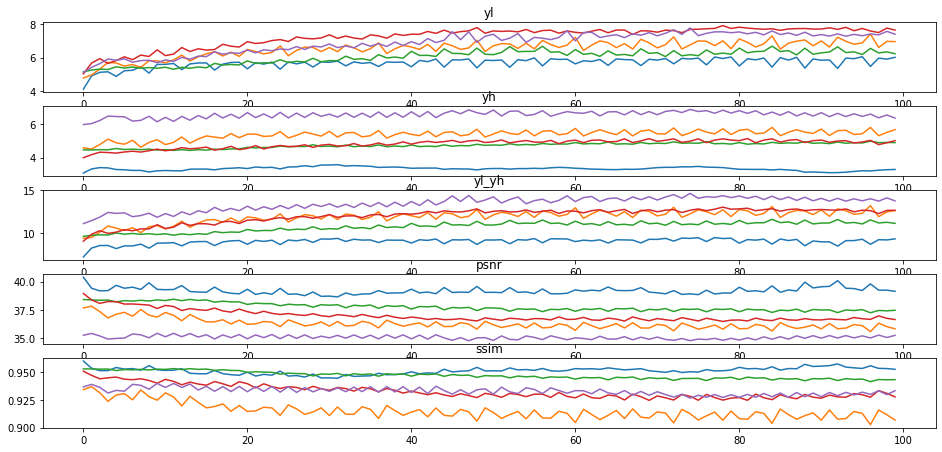

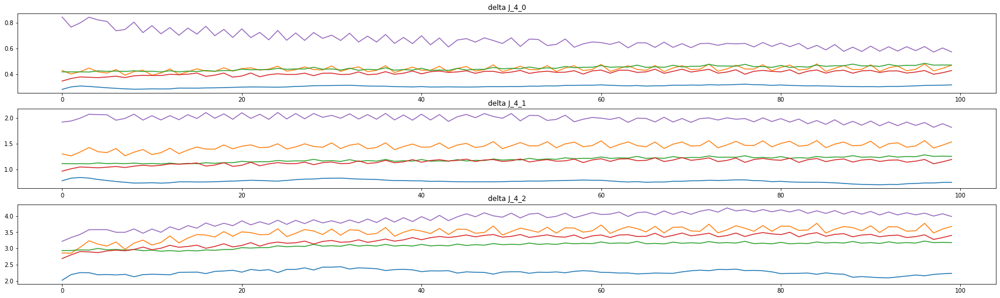

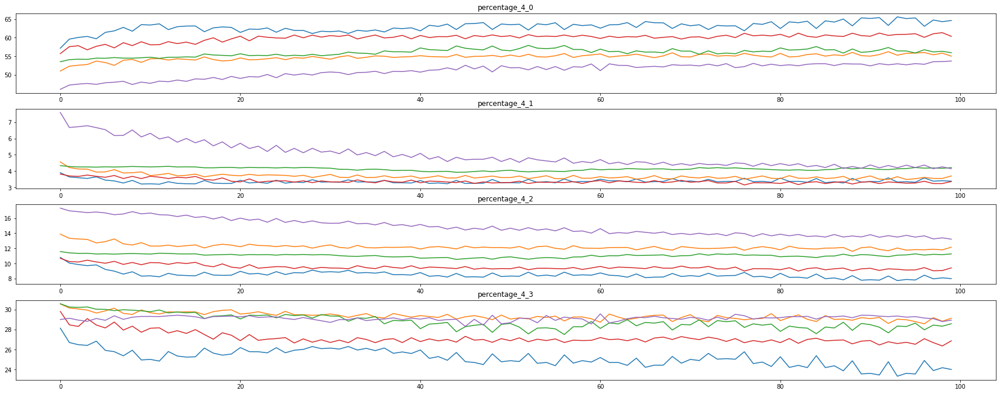

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40001.png]	[PSNR:35.87998518061413]	[SSIM:0.9208440524067301][yl: 5.346106052398682] 	 [yh: 6.846049785614014] 	 [yt: 12.192155838012695] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40002.png]	[PSNR:34.3176059114735]	[SSIM:0.8737588486421468][yl: 7.877679824829102] 	 [yh: 8.453044712543488] 	 [yt: 16.33072453737259] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40003.png]	[PSNR:34.17979850734371]	[SSIM:0.8729238320430095][yl: 7.889569282531738] 	 [yh: 8.625230729579926] 	 [yt: 16.514800012111664] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40004.png]	[PSNR:34.27093142809059]	[SSIM:0.8737832281729069][yl: 8.094513893127441] 	 [yh: 8.455238223075867] 	 [yt: 16.549752116203308] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDr

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40036.png]	[PSNR:34.74011927200579]	[SSIM:0.8866828515957688][yl: 7.982276439666748] 	 [yh: 7.742033779621124] 	 [yt: 15.724310219287872] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40037.png]	[PSNR:34.93900747688704]	[SSIM:0.8940752590992067][yl: 7.313684940338135] 	 [yh: 7.633811950683594] 	 [yt: 14.947496891021729] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40038.png]	[PSNR:34.70279634337612]	[SSIM:0.885241845296111][yl: 8.066904067993164] 	 [yh: 7.772564649581909] 	 [yt: 15.839468717575073] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40039.png]	[PSNR:34.683317781267014]	[SSIM:0.8849138519087147][yl: 7.783573627471924] 	 [yh: 7.895335257053375] 	 [yt: 15.678908884525299] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeN

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40071.png]	[PSNR:34.58394825888017]	[SSIM:0.8825937800029157][yl: 8.11037540435791] 	 [yh: 7.974553763866425] 	 [yt: 16.084929168224335] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40072.png]	[PSNR:34.63142770386287]	[SSIM:0.8841509344890052][yl: 8.344229698181152] 	 [yh: 7.821196556091309] 	 [yt: 16.16542625427246] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40073.png]	[PSNR:34.7822135819988]	[SSIM:0.889605995441729][yl: 7.650055408477783] 	 [yh: 7.791623771190643] 	 [yt: 15.441679179668427] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1920x1080_30fps_420_8bit_AVC_MP40074.png]	[PSNR:34.57891907381906]	[SSIM:0.8825932944254526][yl: 8.414169311523438] 	 [yh: 7.862918436527252] 	 [yt: 16.27708774805069] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\ShakeNDry_1

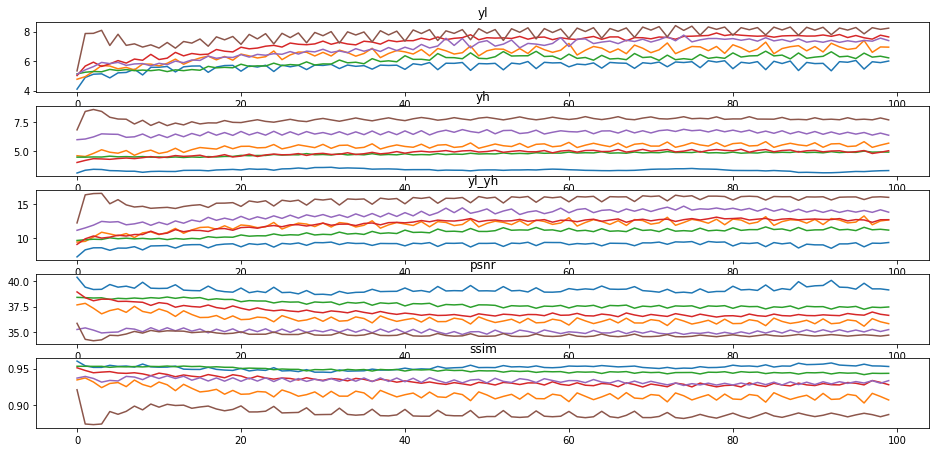

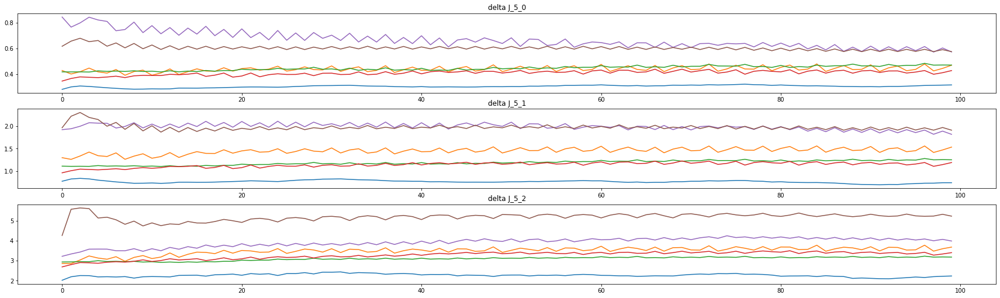

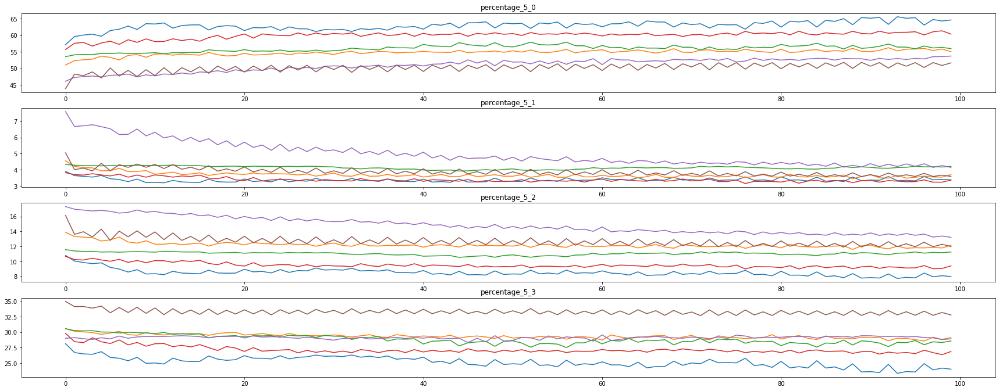

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40001.png]	[PSNR:37.96063615966927]	[SSIM:0.9526995531423892][yl: 4.798655986785889] 	 [yh: 4.207981765270233] 	 [yt: 9.006637752056122] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40002.png]	[PSNR:37.09021890655685]	[SSIM:0.943335442378813][yl: 5.768864154815674] 	 [yh: 4.826702952384949] 	 [yt: 10.595567107200623] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40003.png]	[PSNR:36.598262606589465]	[SSIM:0.937351178231396][yl: 5.869759559631348] 	 [yh: 5.15766054391861] 	 [yt: 11.027420103549957] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40004.png]	[PSNR:36.708785710717834]	[SSIM:0.9384525401855397][yl: 6.127573490142822] 	 [yh: 5.074085056781769] 	 [yt: 11.201658546924591] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRid

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40036.png]	[PSNR:36.15781944206342]	[SSIM:0.9288690059234767][yl: 6.810163497924805] 	 [yh: 5.527130365371704] 	 [yt: 12.337293863296509] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40037.png]	[PSNR:35.83568460957429]	[SSIM:0.9229754236119218][yl: 6.78826379776001] 	 [yh: 5.861710548400879] 	 [yt: 12.649974346160889] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40038.png]	[PSNR:36.15634662560608]	[SSIM:0.9296950352392251][yl: 6.798291206359863] 	 [yh: 5.533263266086578] 	 [yt: 12.331554472446442] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40039.png]	[PSNR:35.865161426948134]	[SSIM:0.923375813213716][yl: 6.766073226928711] 	 [yh: 5.854360818862915] 	 [yt: 12.620434045791626] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRi

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40071.png]	[PSNR:35.663747997685256]	[SSIM:0.9203781238349533][yl: 7.034005165100098] 	 [yh: 5.981414616107941] 	 [yt: 13.015419781208038] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40072.png]	[PSNR:36.083110374709335]	[SSIM:0.927555727925555][yl: 6.8999409675598145] 	 [yh: 5.611083567142487] 	 [yt: 12.511024534702301] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40073.png]	[PSNR:35.72558340619882]	[SSIM:0.9210156100479986][yl: 6.9163737297058105] 	 [yh: 5.937913537025452] 	 [yt: 12.854287266731262] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\YachtRide_1920x1080_30fps_420_8bit_AVC_MP40074.png]	[PSNR:36.09277337075668]	[SSIM:0.9275315804869323][yl: 6.8843793869018555] 	 [yh: 5.611885845661163] 	 [yt: 12.496265232563019] 

[D:\Github\FYP2020\test_sequence\AVC\test_frames_qp37\Ya

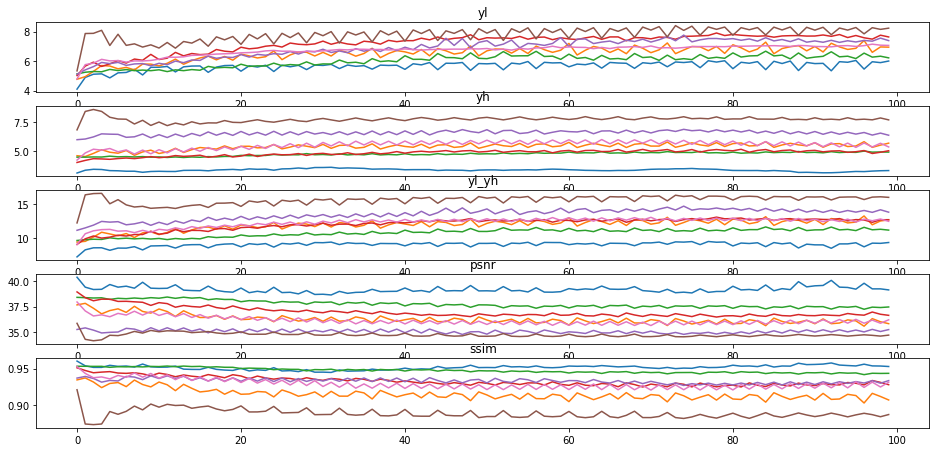

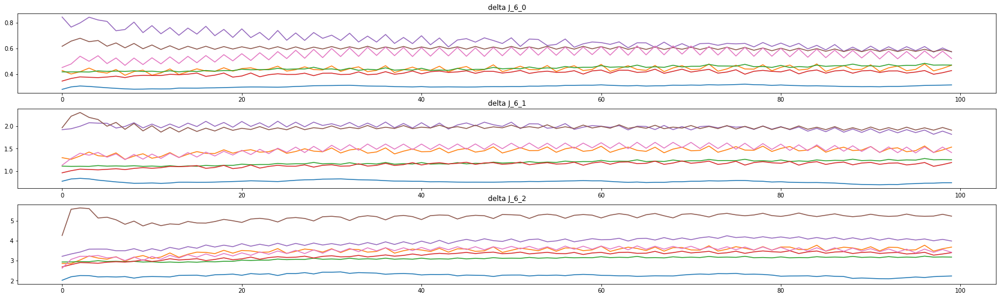

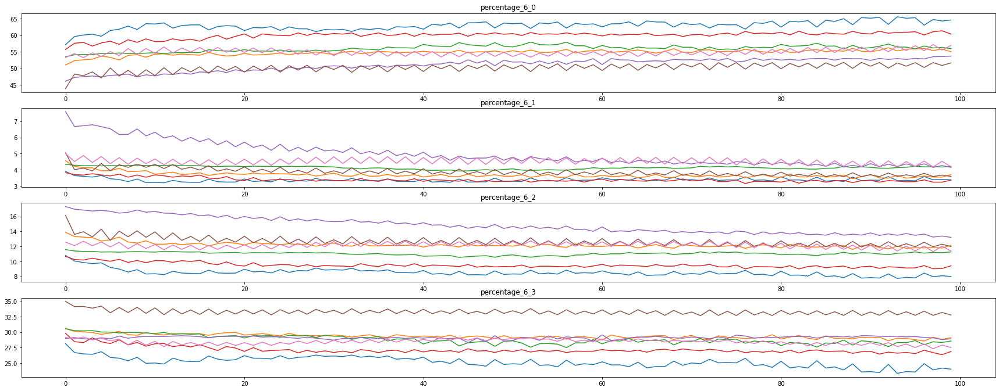

In [37]:
vcodec = 'libx264'

J = 3 # level of decomposition

if vcodec == 'libx264':
#         hr_test_dir = os.path.join(os.path.join(Flags.test_dir, "AVC"), 'original')
#         hr_test_frames_dir = os.path.join(os.path.join(Flags.test_dir, "AVC"), 'test_frames')
#         lr_test_dir = os.path.join(os.path.join(Flags.test_dir, "AVC"), 'qp'+str(Flags.qp))
#         lr_test_frames_dir = os.path.join(os.path.join(Flags.test_dir, "AVC"), 'test_frames_qp'+str(Flags.qp))
    hr_test_frames_dir = 'D:\\Github\\FYP2020\\test_sequence\\AVC\\test_frames'
    lr_test_frames_dir = 'D:\\Github\\FYP2020\\test_sequence\\AVC\\test_frames_qp37'

#     if Flags.vcodec == 'libx265':
#         hr_test_dir = os.path.join(os.path.join(Flags.test_dir, "HEVC"), 'original')
#         hr_test_frames_dir = os.path.join(os.path.join(Flags.test_dir, "HEVC"), 'test_frames')
#         lr_test_dir = os.path.join(os.path.join(Flags.test_dir, "HEVC"), 'qp'+str(Flags.qp))
#         lr_test_frames_dir = os.path.join(os.path.join(Flags.test_dir, "HEVC"), 'test_frames_qp'+str(Flags.qp))
# process the number of images in the file
print(lr_test_frames_dir)
total_test_images = 0
test_image_name_list = []
for filename in os.listdir(lr_test_frames_dir):
    if('.png' in filename):
        test_image_name_list.append(filename)
        total_test_images += 1
print(len(test_image_name_list))
log_file = os.path.join('.', "dwt_stats.txt")
touch(log_file)
print(log_file)
psnr_stats_list = []
ssim_stats_list = []

#     with open(log_file, 'w') as f:
# xfm = DTCWTForward(J=3)
# ifm = DTCWTInverse()
xfm = DTCWTForward(J=J, biort='near_sym_b', qshift='qshift_b').cuda()
ifm = DTCWTInverse( biort='near_sym_b', qshift='qshift_b').cuda()

delta_dctwt_yl = []
delta_dctwt_yh = []
delta_dctwt_yh_J = []
delta_dctwt_yl_yh = []
delta_dctwt_yh_J_p = []
psnr_stats_list = []
ssim_stats_list = []

temp_delta_dctwt_yl = []
temp_delta_dctwt_yh = []
temp_delta_dctwt_yh_J = [[] for _ in range(J)]
temp_delta_dctwt_yl_yh = []
print(len(temp_delta_dctwt_yh_J))
temp_delta_dctwt_yh_J_p = [[] for _ in range(J+1)]
temp_psnr_stats_list = []
temp_ssim_stats_list = []

yl_input, yh_input = None, None
for t in range( len(test_image_name_list) ):
    with open(log_file, 'w') as f:
        input_image_path = os.path.join(lr_test_frames_dir, test_image_name_list[t])
        input_image = cv2.imread(input_image_path, cv2.IMREAD_UNCHANGED)
        h,w,c = input_image.shape
        input_yuv_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2YUV)
        y_input, _, _ = cv2.split(input_yuv_image)
        # input_image = np.expand_dims(y_input, axis=2)

        gt_image_path = os.path.join(hr_test_frames_dir, test_image_name_list[t])
        gt_image = cv2.imread(gt_image_path, cv2.IMREAD_UNCHANGED)
        h,w,c = gt_image.shape
        gt_yuv_image = cv2.cvtColor(gt_image, cv2.COLOR_RGB2YUV)
        y_gt, _, _ = cv2.split(gt_yuv_image)

#         fig = plt.figure()
#         ax = fig.add_subplot(121)
#         ax.imshow(y_input, cmap=plt.get_cmap('gray'))
#         ax = fig.add_subplot(122)
#         ax.imshow(y_gt, cmap=plt.get_cmap('gray'))
#         plt.show()

        y_input_4D = y_input[np.newaxis,np.newaxis,:,:]
    #     print(y_input_4D.shape)
        y_gt_4D = y_gt[np.newaxis,np.newaxis,:,:]

    #         break
        img_input = torch.from_numpy(y_input_4D).float().cuda()
        img_gt = torch.from_numpy(y_gt_4D).float().cuda()
        

        yl_input, yh_input = xfm(img_input)
        yl_gt, yh_gt = xfm(img_gt)

        yl_diff = np.mean(np.abs(yl_gt.detach().cpu().numpy() - yl_input.detach().cpu().numpy()))
        yh_diff = 0.0
        for i, _ in enumerate(yh_input):
            diff = np.mean(np.abs(yh_input[i].detach().cpu().numpy() - yh_gt[i].detach().cpu().numpy()))
            temp_delta_dctwt_yh_J[i].append(diff)
            yh_diff += diff

        for i, _ in enumerate([yl_input] + yh_input):
            if i == 0:
                temp_delta_dctwt_yh_J_p[i].append(yl_diff/(yl_diff+yh_diff)*100)
            else:
                temp_delta_dctwt_yh_J_p[i].append(temp_delta_dctwt_yh_J[i-1][-1]/(yl_diff+yh_diff)*100)
        
        psnr_value = psnr(y_gt,y_input)
        ssim_value = ssim(y_gt,y_input)

        logmsg = ("[" + input_image_path + "]\t[PSNR:" + str(psnr_value) + "]\t[SSIM:"+ str(ssim_value) + "]")
        logmsg += ("[yl: {}] \t [yh: {}] \t [yt: {}] \n".format( yl_diff, yh_diff, yl_diff + yh_diff))
        print(logmsg)
        f.write(logmsg)
        f.flush()
#         print("[img_{}] yl: {} \t yh: {} \t total: {}".format(t, yl_diff, yh_diff, yl_diff + yh_diff))

        temp_delta_dctwt_yl.append(yl_diff)
        temp_delta_dctwt_yh.append(yh_diff)
        temp_delta_dctwt_yl_yh.append(yl_diff + yh_diff)
        temp_psnr_stats_list.append(psnr_value)
        temp_ssim_stats_list.append(ssim_value)

        if ( (t+1) % 100 == 0):
            delta_dctwt_yl.append(temp_delta_dctwt_yl)
            delta_dctwt_yh.append(temp_delta_dctwt_yh)
            delta_dctwt_yl_yh.append(temp_delta_dctwt_yl_yh)
            delta_dctwt_yh_J_p.append(temp_delta_dctwt_yh_J_p)
            delta_dctwt_yh_J.append(temp_delta_dctwt_yh_J)
#             print(len(delta_dctwt_yh_J))
#             print(len(delta_dctwt_yh_J[0]))
#             print(len(delta_dctwt_yh_J[0][0]))
            
            psnr_stats_list.append(temp_psnr_stats_list)
            ssim_stats_list.append(temp_ssim_stats_list)
            fig = plt.figure()
            ax = fig.add_subplot(611)
            for yl in delta_dctwt_yl:
                ax.plot(list(range(len(yl))), yl)
            plt.title("yl")
            ax = fig.add_subplot(612)
            for yh in delta_dctwt_yh:
                ax.plot(list(range(len(yh))), yh)
            plt.title("yh")
            ax = fig.add_subplot(613)
            for yt in delta_dctwt_yl_yh:
                ax.plot(list(range(len(yt))), yt)
            plt.title("yl_yh")
            ax = fig.add_subplot(614)
            for ps in psnr_stats_list:
                ax.plot(list(range(len(ps))), ps)
            plt.title("psnr")
            ax = fig.add_subplot(615)
            for ss in ssim_stats_list:
                ax.plot(list(range(len(ss))), ss)
            plt.title("ssim")
            plt.show()
            
#             ax = fig.add_subplot(616)
            fig2 = plt.figure(figsize=(30,300))
            for j, tmp in enumerate(delta_dctwt_yh_J[0]):
                ax = fig2.add_subplot(len(tmp),1,j+1)
                for i, yhj in enumerate(delta_dctwt_yh_J):
#                     print(yhj)
                    ax.plot(list(range(len(delta_dctwt_yh_J[i][j]))), delta_dctwt_yh_J[i][j])
                plt.title("delta J_{}_{}".format(i,j))
            plt.show()

            fig3 = plt.figure(figsize=(30,300))
            for j, tmp in enumerate(delta_dctwt_yh_J_p[0]):
                ax = fig3.add_subplot(len(tmp),1,j+1)
                for i, yhj in enumerate(delta_dctwt_yh_J_p):
#                     print(yhj)
                    ax.plot(list(range(len(delta_dctwt_yh_J_p[i][j]))), delta_dctwt_yh_J_p[i][j])
                plt.title("percentage_{}_{}".format(i,j))
            plt.show()

            temp_delta_dctwt_yl = []
            temp_delta_dctwt_yh = []
            temp_delta_dctwt_yh_J = [[] for _ in range(J)]
            temp_delta_dctwt_yl_yh = []
#             print(len(temp_delta_dctwt_yh_J))
            temp_delta_dctwt_yh_J_p = [[] for _ in range(J+1)]
            temp_psnr_stats_list = []
            temp_ssim_stats_list = []
            
        
#     if (t < 10):
#         diff = yl_gt.numpy() - yl_input.numpy()
#         fig = plt.figure()
#         ax = fig.add_subplot(131)
#         ax.imshow(yl_gt.numpy()[0,0,:,:], cmap=plt.get_cmap('gray'))
#         ax = fig.add_subplot(132)
#         ax.imshow(yl_input.numpy()[0,0,:,:], cmap=plt.get_cmap('gray'))
#         ax = fig.add_subplot(133)
#         ax.imshow(diff[0,0,:,:], cmap=plt.get_cmap('gray'))
#         plt.show()
#     break
    
#     # Create 12 outputs, one for the real and imaginary point spread functions
#     # for each of the 6 orientations
#     out_input = np.zeros((12,h,w))

    
#     # Can now plot the output
#     for b in range(6):
#         for ri in range(2):
#             yh[2][0,0,b,4,4,ri] = 1
#             out_input[b*2 + ri] = ifm((yl, yh))
#             yh[2][0,0,b,4,4,ri] = 0
            
#     fig = plt.figure()
#     for i in range(12):
#         ax = fig.add_subplot(3,4,i+1)
#         ax.imshow(out_input[i,:,:], cmap=plt.get_cmap('gray'))
#         plt.show()

In [44]:
print(len(temp_delta_dctwt_yh_J))
print("min:{} \t max:{} \t mean:{}".format(np.min(temp_delta_dctwt_yh_J[0]),np.max(temp_delta_dctwt_yh_J[0]), np.mean(temp_delta_dctwt_yh_J[0])))
print(len(temp_delta_dctwt_yh_J))
print("min:{} \t max:{} \t mean:{}".format(np.min(temp_delta_dctwt_yh_J[1]),np.max(temp_delta_dctwt_yh_J[1]), np.mean(temp_delta_dctwt_yh_J[1])))
print(len(temp_delta_dctwt_yh_J))
print("min:{} \t max:{} \t mean:{}".format(np.min(temp_delta_dctwt_yh_J[2]),np.max(temp_delta_dctwt_yh_J[2]), np.mean(temp_delta_dctwt_yh_J[2])))
print(len(temp_delta_dctwt_yl))
print("min:{} \t max:{} \t mean:{}".format(np.min(temp_delta_dctwt_yl[0]),np.max(temp_delta_dctwt_yl[0]), np.mean(temp_delta_dctwt_yl[0])))

3
min:1745293.0 	 max:1745293.0 	 mean:1745293.0
3
min:1206372.5 	 max:1206372.5 	 mean:1206372.5
3
min:786044.3125 	 max:786044.3125 	 mean:786044.3125
0


IndexError: list index out of range

In [10]:
print(len(yh_input))
print(yh_input[0].shape)
print(yh_input[1].shape)
print(yh_input[2].shape)

TypeError: object of type 'NoneType' has no len()

In [ ]:
p_yh_input = yh_input[0].permute(0,3,4,1,2,5)
print(p_yh_input.shape)
p_yh_input = p_yh_input.contiguous().view(1,540,960,-1)
p_yh_input = p_yh_input.permute(0,3,1,2)
print(p_yh_input.shape)

In [ ]:
p_yh_input = p_yh_input.permute(0,2,3,1)
print(p_yh_input.shape)
p_yh_input = p_yh_input.view(1,540,960,1,6,2)
print(p_yh_input.shape)
p_yh_input = p_yh_input.permute(0,3,4,1,2,5)
print(p_yh_input.shape)

In [ ]:
Y = ifm((yl_input, yh_input))
print(Y.shape)

In [ ]:
print(np.sum((Y-img_input).detach().cpu().numpy()))

In [ ]:
numpy_input = img_input[0,0,:,:].detach().cpu().numpy()
numpy_gt = img_gt[0,0,:,:].detach().cpu().numpy()

fig3 = plt.figure()
ax = fig3.add_subplot(121)
ax.imshow(numpy_input, cmap=plt.get_cmap('gray'))
ax = fig3.add_subplot(122)
ax.imshow(numpy_gt, cmap=plt.get_cmap('gray'))


In [11]:
import torch
import torch.nn as nn
import torch.nn.functional as F
J = 3
xfm = DTCWTForward(J=J, biort='near_sym_b', qshift='qshift_b').cuda()
ifm = DTCWTInverse( biort='near_sym_b', qshift='qshift_b').cuda()

class ARCNN(nn.Module):
    def __init__(self, in_channels, out_channels, conv_block=None):
        super(ARCNN, self).__init__()
        self.base = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=9, padding=4),
            nn.PReLU(),
            nn.Conv2d(64, 32, kernel_size=7, padding=3),
            nn.PReLU(),
            nn.Conv2d(32, 16, kernel_size=1),
            nn.PReLU()
        )
        self.last = nn.Conv2d(16, out_channels, kernel_size=5, padding=2)

        self._initialize_weights()

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.normal_(m.weight, std=0.001)

    def forward(self, x):
        x = self.base(x)
        x = self.last(x)
        return x

In [38]:

xfm.train()
ifm.train()
for p in xfm.parameters():
    p.requires_grad = True
    print(p.requires_grad)

    
for p in ifm.parameters():
    p.requires_grad= True
    print(p.requires_grad)
params = list(xfm.parameters()) + list(ifm.parameters())

criterion_reconstruction = nn.L1Loss(size_average=None, reduce=None, reduction='mean').cuda()

ARCNN_1 = ARCNN(12,12).cuda()
ARCNN_2 = ARCNN(12,12).cuda()
ARCNN_3 = ARCNN(12,12).cuda()
ARCNN_1._initialize_weights()
ARCNN_2._initialize_weights()
ARCNN_3._initialize_weights()
upsample_2 = nn.UpsamplingBilinear2d(scale_factor=2).cuda()
upsample_4 = nn.UpsamplingBilinear2d(scale_factor=4).cuda()
dwsample_2 = torch.nn.AvgPool2d(2, stride=2, padding=0, ceil_mode=False, count_include_pad=True, divisor_override=None).cuda()
dwsample_4 = torch.nn.AvgPool2d(4, stride=4, padding=0, ceil_mode=False, count_include_pad=True, divisor_override=None).cuda()

ARCNN_list = [ARCNN_1, ARCNN_2, ARCNN_3]

UP = [None, upsample_2, upsample_4]
DOWN = [None, dwsample_2, dwsample_4]
# params = list(xfm.parameters()) + list(ifm.parameters())
optimizer = torch.optim.Adam([
    {'params': params},
    {'params': ARCNN_list[0].base.parameters()},
    {'params': ARCNN_list[0].last.parameters(), 'lr': 5e-3 * 0.1},
    {'params': ARCNN_list[1].base.parameters()},
    {'params': ARCNN_list[1].last.parameters(), 'lr': 5e-3 * 0.1},
    {'params': ARCNN_list[2].base.parameters()},
    {'params': ARCNN_list[2].last.parameters(), 'lr': 5e-3 * 0.1},

    {'params': upsample_2.parameters()},
    {'params': upsample_4.parameters(), 'lr': 5e-3 * 0.1},

    {'params': dwsample_2.parameters()},
    {'params': dwsample_4.parameters(), 'lr': 5e-3 * 0.1},
], lr=5e-3)
# optimizer = torch.optim.Adam(params, lr=0.001)

with torch.set_grad_enabled(True):
    for iteration in range(500):
        ol, oh = xfm(img_input)
        
        p_yh = []
        for i, h in enumerate(oh):
            p_yh_input = oh[i].permute(0,3,4,1,2,5)
            p_yh_input = p_yh_input.contiguous().view(1,540// (2**i),960// (2**i),-1)
            p_yh_input = p_yh_input.permute(0,3,1,2)
            if(UP[i] is not None):
                p_yh_input = UP[i](p_yh_input)
#             print(p_yh_input.shape)
            p_yh_input = ARCNN_list[i](p_yh_input)
            if(DOWN[i] is not None):
                p_yh_input = DOWN[i](p_yh_input)
            
            p_yh_input = p_yh_input.permute(0,2,3,1)
#             print(p_yh_input.shape)
            p_yh_input = p_yh_input.view(1,540// (2**i),960// (2**i),1,6,2)
#             print(p_yh_input.shape)
            p_yh_input = p_yh_input.permute(0,3,4,1,2,5)
#             print(p_yh_input.shape)            
            p_yh.append(p_yh_input)        
        
        
        o = ifm((ol,p_yh))
        loss = criterion_reconstruction(o, img_gt)
        print("iterations: ", iteration,"loss: ", loss)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
    
    
    

True
True
True
True
True
True
True
True
True
True
True
True
iterations:  0 loss:  tensor(2.1814, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  1 loss:  tensor(2.1811, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  2 loss:  tensor(2.1806, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  3 loss:  tensor(2.1727, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  4 loss:  tensor(2.1541, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  5 loss:  tensor(2.1450, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  6 loss:  tensor(2.1189, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  7 loss:  tensor(2.0985, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  8 loss:  tensor(2.1005, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  9 loss:  tensor(2.0753, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  10 loss:  tensor(2.0661, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  11 loss:  tensor(2.0512, device='cuda:0', grad

iterations:  101 loss:  tensor(1.6340, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  102 loss:  tensor(1.6299, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  103 loss:  tensor(1.6291, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  104 loss:  tensor(1.6271, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  105 loss:  tensor(1.6251, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  106 loss:  tensor(1.6227, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  107 loss:  tensor(1.6204, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  108 loss:  tensor(1.6195, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  109 loss:  tensor(1.6170, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  110 loss:  tensor(1.6176, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  111 loss:  tensor(1.6141, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  112 loss:  tensor(1.6127, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  113

iterations:  201 loss:  tensor(1.5053, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  202 loss:  tensor(1.5046, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  203 loss:  tensor(1.5004, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  204 loss:  tensor(1.5008, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  205 loss:  tensor(1.5014, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  206 loss:  tensor(1.4998, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  207 loss:  tensor(1.5016, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  208 loss:  tensor(1.4947, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  209 loss:  tensor(1.4955, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  210 loss:  tensor(1.4966, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  211 loss:  tensor(1.4981, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  212 loss:  tensor(1.4950, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  213

iterations:  301 loss:  tensor(1.4315, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  302 loss:  tensor(1.4426, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  303 loss:  tensor(1.4228, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  304 loss:  tensor(1.4283, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  305 loss:  tensor(1.4278, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  306 loss:  tensor(1.4240, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  307 loss:  tensor(1.4193, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  308 loss:  tensor(1.4263, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  309 loss:  tensor(1.4244, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  310 loss:  tensor(1.4326, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  311 loss:  tensor(1.4286, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  312 loss:  tensor(1.4288, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  313

iterations:  401 loss:  tensor(1.3774, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  402 loss:  tensor(1.3832, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  403 loss:  tensor(1.3732, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  404 loss:  tensor(1.3826, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  405 loss:  tensor(1.3765, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  406 loss:  tensor(1.3820, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  407 loss:  tensor(1.3739, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  408 loss:  tensor(1.3718, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  409 loss:  tensor(1.3746, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  410 loss:  tensor(1.3693, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  411 loss:  tensor(1.3671, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  412 loss:  tensor(1.3682, device='cuda:0', grad_fn=<L1LossBackward>)
iterations:  413

In [ ]:
# ARCNN_list = [ARCNN_1, ARCNN_2, ARCNN_3]

# UP = [None, upsample_2, upsample_4]
# DOWN = [None, dwsample_2, dwsample_4]
for a in ARCNN_list:
    a.cuda()

for u in UP:
    if u is not None:
        u.cuda()

for d in DOWN:
    if d is not None:
        d.cuda()
xfm.cuda()
ifm.cuda()

3
torch.Size([1, 1, 1080, 1920])
40.37858735607854 	 0.9602251167900638
43.91041270211226 	 0.9808170163789062


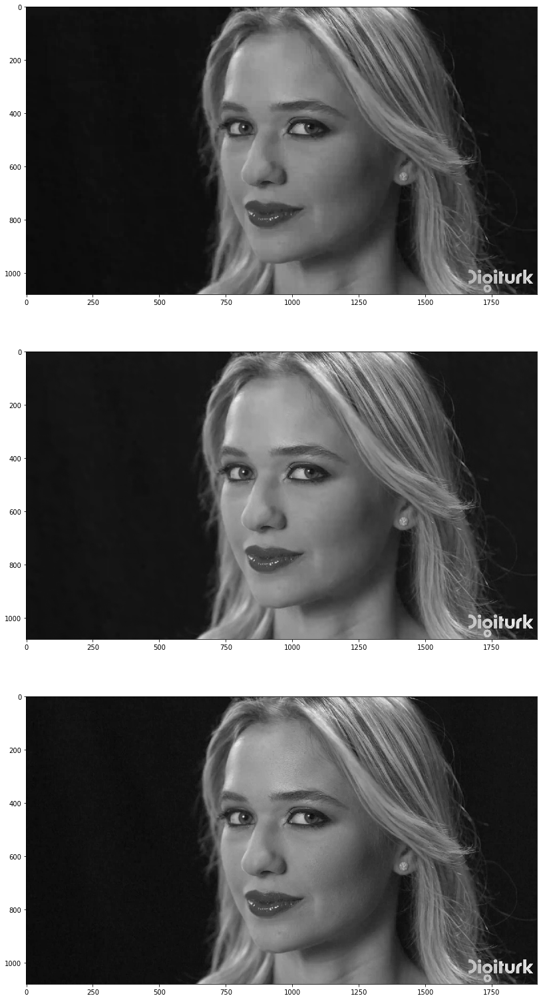

In [37]:
delta_dctwt_yl = []
delta_dctwt_yh = []
delta_dctwt_yh_J = []
delta_dctwt_yl_yh = []

temp_delta_dctwt_yl = []
temp_delta_dctwt_yh = []
temp_delta_dctwt_yh_J = [[] for _ in range(J)]
temp_delta_dctwt_yl_yh = []
print(len(temp_delta_dctwt_yh_J))

# yl_input, yh_input = None, None
# for t in range( len(test_image_name_list) ):
#     with open(log_file, 'w') as f:
#         input_image_path = os.path.join(lr_test_frames_dir, test_image_name_list[t])
#         input_image = cv2.imread(input_image_path, cv2.IMREAD_UNCHANGED)
#         h,w,c = input_image.shape
#         input_yuv_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2YUV)
#         y_input, _, _ = cv2.split(input_yuv_image)
#         # input_image = np.expand_dims(y_input, axis=2)

#         gt_image_path = os.path.join(hr_test_frames_dir, test_image_name_list[t])
#         gt_image = cv2.imread(gt_image_path, cv2.IMREAD_UNCHANGED)
#         h,w,c = gt_image.shape
#         gt_yuv_image = cv2.cvtColor(gt_image, cv2.COLOR_RGB2YUV)
#         y_gt, _, _ = cv2.split(gt_yuv_image)

# #         fig = plt.figure()
# #         ax = fig.add_subplot(121)
# #         ax.imshow(y_input, cmap=plt.get_cmap('gray'))
# #         ax = fig.add_subplot(122)
# #         ax.imshow(y_gt, cmap=plt.get_cmap('gray'))
# #         plt.show()

#         y_input_4D = y_input[np.newaxis,np.newaxis,:,:]
#     #     print(y_input_4D.shape)
#         y_gt_4D = y_gt[np.newaxis,np.newaxis,:,:]

#     #         break
#         img_input = torch.from_numpy(y_input_4D).float().cuda()
#         img_gt = torch.from_numpy(y_gt_4D).float().cuda()
#         yl_input, yh_input = xfm(img_input)
#         yl_gt, yh_gt = xfm(img_gt)
#         break
        
# ol, oh = xfm(img_input)
        
# p_yh = []
# for i, h in enumerate(oh):
#     p_yh_input = oh[i].permute(0,3,4,1,2,5)
#     p_yh_input = p_yh_input.contiguous().view(1,540// (2**i),960// (2**i),-1)
#     p_yh_input = p_yh_input.permute(0,3,1,2)
#     if(UP[i] is not None):
#         p_yh_input = UP[i](p_yh_input)
# #             print(p_yh_input.shape)
#     p_yh_input = ARCNN_list[i](p_yh_input)
#     if(DOWN[i] is not None):
#         p_yh_input = DOWN[i](p_yh_input)

#     p_yh_input = p_yh_input.permute(0,2,3,1)
# #             print(p_yh_input.shape)
#     p_yh_input = p_yh_input.view(1,540// (2**i),960// (2**i),1,6,2)
# #             print(p_yh_input.shape)
#     p_yh_input = p_yh_input.permute(0,3,4,1,2,5)
# #             print(p_yh_input.shape)            
#     p_yh.append(p_yh_input)        


# o = ifm((ol,p_yh))

yh_diff = 0.0
for i, _ in enumerate(yh_input):
    diff = np.sum(np.abs(yh_input[i].detach().cpu().numpy() - yh_gt[i].detach().cpu().numpy()))
    temp_delta_dctwt_yh_J[i].append(diff)
    yh_diff += diff
temp_delta_dctwt_yh_J_o = [[] for _ in range(J)]
yh_diff_o = 0.0
for i, _ in enumerate(oh):
    diff = np.sum(np.abs(oh[i].detach().cpu().numpy() - yh_gt[i].detach().cpu().numpy()))
    temp_delta_dctwt_yh_J_o[i].append(diff)
    yh_diff += diff
psnr_value = psnr(y_gt,y_input)
ssim_value = ssim(y_gt,y_input)
print(o.shape)
psnr_value_o = psnr(y_gt,o[0,0,:,:].detach().cpu().numpy())
ssim_value_o = ssim(y_gt,o[0,0,:,:].detach().cpu().numpy())
print(psnr_value, "\t", ssim_value)
print(psnr_value_o, "\t", ssim_value_o)
fig = plt.figure()
ax = fig.add_subplot(311)
ax.imshow(img_input[0,0,:,:].detach().cpu().numpy(), cmap=plt.get_cmap('gray'))
ax = fig.add_subplot(312)
ax.imshow(o[0,0,:,:].detach().cpu().numpy(), cmap=plt.get_cmap('gray'))
ax = fig.add_subplot(313)
ax.imshow(img_gt[0,0,:,:].detach().cpu().numpy(), cmap=plt.get_cmap('gray'))
plt.show()

In [ ]:

psnr_stats_list = []
ssim_stats_list = []

psnr_stats_list_o = []
ssim_stats_list_o = []


delta_dctwt_yl = []
delta_dctwt_yh = []
delta_dctwt_yh_J = []
delta_dctwt_yl_yh = []

delta_dctwt_yl_o = []
delta_dctwt_yh_o = []
delta_dctwt_yh_J_o = []
delta_dctwt_yl_yh_o = []

temp_delta_dctwt_yl = []
temp_delta_dctwt_yh = []
temp_delta_dctwt_yh_J = [[] for _ in range(J)]
temp_delta_dctwt_yl_yh = []
print(len(temp_delta_dctwt_yh_J))

temp_delta_dctwt_yl_o = []
temp_delta_dctwt_yh_o = []
temp_delta_dctwt_yh_J_o = [[] for _ in range(J)]
temp_delta_dctwt_yl_yh_o = []

yl_input, yh_input = None, None
for t in range( len(test_image_name_list) ):
    with open(log_file, 'w') as f:
        input_image_path = os.path.join(lr_test_frames_dir, test_image_name_list[t])
        input_image = cv2.imread(input_image_path, cv2.IMREAD_UNCHANGED)
        h,w,c = input_image.shape
        input_yuv_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2YUV)
        y_input, _, _ = cv2.split(input_yuv_image)
        # input_image = np.expand_dims(y_input, axis=2)

        gt_image_path = os.path.join(hr_test_frames_dir, test_image_name_list[t])
        gt_image = cv2.imread(gt_image_path, cv2.IMREAD_UNCHANGED)
        h,w,c = gt_image.shape
        gt_yuv_image = cv2.cvtColor(gt_image, cv2.COLOR_RGB2YUV)
        y_gt, _, _ = cv2.split(gt_yuv_image)

#         fig = plt.figure()
#         ax = fig.add_subplot(121)
#         ax.imshow(y_input, cmap=plt.get_cmap('gray'))
#         ax = fig.add_subplot(122)
#         ax.imshow(y_gt, cmap=plt.get_cmap('gray'))
#         plt.show()

        y_input_4D = y_input[np.newaxis,np.newaxis,:,:]
    #     print(y_input_4D.shape)
        y_gt_4D = y_gt[np.newaxis,np.newaxis,:,:]

    #         break
        img_input_t = torch.from_numpy(y_input_4D).float()
        img_gt_t = torch.from_numpy(y_gt_4D).float()


        yl_input, yh_input = xfm(img_input_t)
        yl_gt, yh_gt = xfm(img_gt_t)

        yl_diff = np.sum(np.abs(yl_gt.cpu().numpy() - yl_input.cpu().numpy()))
        yh_diff = 0.0
        for i, _ in enumerate(yh_input):
            diff = np.sum(np.abs(yh_input[i].cpu().numpy() - yh_gt[i].cpu().numpy()))
            temp_delta_dctwt_yh_J[i].append(diff)
            yh_diff += diff

        psnr_value = psnr(y_gt,y_input)
        ssim_value = ssim(y_gt,y_input)

        p_yh = []
        for i, h in enumerate(oh):
            p_yh_input = yh_input[i].cuda().permute(0,3,4,1,2,5)
            p_yh_input = p_yh_input.contiguous().view(1,540// (2**i),960// (2**i),-1)
            p_yh_input = p_yh_input.permute(0,3,1,2)
            if(UP[i] is not None):
                p_yh_input = UP[i](p_yh_input)
#             print(p_yh_input.shape)
            p_yh_input = ARCNN_list[i](p_yh_input)
            if(DOWN[i] is not None):
                p_yh_input = DOWN[i](p_yh_input)
            
            p_yh_input = p_yh_input.permute(0,2,3,1)
#             print(p_yh_input.shape)
            p_yh_input = p_yh_input.view(1,540// (2**i),960// (2**i),1,6,2)
#             print(p_yh_input.shape)
            p_yh_input = p_yh_input.permute(0,3,4,1,2,5)
#             print(p_yh_input.shape)            
            p_yh.append(p_yh_input)        
        
        yh_diff_o = 0.0
        for i, _ in enumerate(p_yh):
            diff = np.sum(np.abs(p_yh[i].detach().cpu().numpy() - yh_gt[i].detach().cpu().numpy()))
            temp_delta_dctwt_yh_J_o[i].append(diff)
            yh_diff_o += diff
        
        o = ifm((ol,p_yh))        
        psnr_value_o = psnr(y_gt,o.cpu().numpy())
        ssim_value_o = ssim(y_gt,o.cpu().numpy())
        
        logmsg = ("[" + input_image_path + "]\t[PSNR:" + str(psnr_value) + "]\t[SSIM:"+ str(ssim_value) + "]")
        logmsg += ("[yl: {}] \t [yh: {}] \t [yt: {}] ".format(t, yl_diff, yh_diff, yl_diff + yh_diff))
        logmsg += ("[yl: {}] \t [yh: {}] \t [yt: {}] \n".format(t, yl_diff, yh_diff_o, yl_diff + yh_diff_o))
        print(logmsg)
        f.write(logmsg)
        f.flush()
#         print("[img_{}] yl: {} \t yh: {} \t total: {}".format(t, yl_diff, yh_diff, yl_diff + yh_diff))

        temp_delta_dctwt_yl.append(yl_diff)
        temp_delta_dctwt_yh.append(yh_diff)
        temp_delta_dctwt_yl_yh.append(yl_diff + yh_diff)
        psnr_stats_list.append(psnr_value)
        ssim_stats_list.append(ssim_value)

        temp_delta_dctwt_yl_o.append(yl_diff)
        temp_delta_dctwt_yh_o.append(yh_diff_o)
        temp_delta_dctwt_yl_yh_o.append(yl_diff + yh_diff_o)
        psnr_stats_list_o.append(psnr_value_o)
        ssim_stats_list_o.append(ssim_value_o)
        
        if ( (t+1) % 100 == 0):
            delta_dctwt_yl.append(temp_delta_dctwt_yl)
            delta_dctwt_yh.append(temp_delta_dctwt_yh)
            delta_dctwt_yl_yh.append(temp_delta_dctwt_yl_yh)
            fig = plt.figure()
            ax = fig.add_subplot(611)
            for yl in delta_dctwt_yl:
                ax.plot(list(range(len(yl))), yl)
            ax = fig.add_subplot(612)
            for yh in delta_dctwt_yh:
                ax.plot(list(range(len(yh))), yh)
            ax = fig.add_subplot(613)
            for yt in delta_dctwt_yl_yh:
                ax.plot(list(range(len(yt))), yt)
            ax = fig.add_subplot(614)
            ax.plot(list(range(len(psnr_stats_list))), psnr_stats_list)
            ax = fig.add_subplot(615)
            ax.plot(list(range(len(ssim_stats_list))), ssim_stats_list)
            plt.show()
            
#             ax = fig.add_subplot(616)
            fig2 = plt.figure()
            for i, yhj in enumerate(temp_delta_dctwt_yh_J):
                ax = fig2.add_subplot(len(temp_delta_dctwt_yh_J),1,i+1)
                ax.plot(list(range(len(yhj))), yhj)

            plt.show()

            delta_dctwt_yl_o.append(temp_delta_dctwt_yl_o)
            delta_dctwt_yh_o.append(temp_delta_dctwt_yh_o)
            delta_dctwt_yl_yh_o.append(temp_delta_dctwt_yl_yh_o)
            fig = plt.figure()
            ax = fig.add_subplot(611)
            for yl in delta_dctwt_yl_o:
                ax.plot(list(range(len(yl))), yl)
            ax = fig.add_subplot(612)
            for yh in delta_dctwt_yh_o:
                ax.plot(list(range(len(yh))), yh)
            ax = fig.add_subplot(613)
            for yt in delta_dctwt_yl_yh_o:
                ax.plot(list(range(len(yt))), yt)
            ax = fig.add_subplot(614)
            ax.plot(list(range(len(psnr_stats_list_o))), psnr_stats_list_o)
            ax = fig.add_subplot(615)
            ax.plot(list(range(len(ssim_stats_list_o))), ssim_stats_list_o)
            plt.show()
            
#             ax = fig.add_subplot(616)
            fig2 = plt.figure()
            for i, yhj in enumerate(temp_delta_dctwt_yh_J_o):
                ax = fig2.add_subplot(len(temp_delta_dctwt_yh_J_o),1,i+1)
                ax.plot(list(range(len(yhj))), yhj)

            plt.show()
            
            temp_delta_dctwt_yl = []
            temp_delta_dctwt_yh = []
            temp_delta_dctwt_yl_yh = []